# 📖 **Comparative Analysis of Literary Translations in the Odyssey: Lexical Diversity and Frequency Trends**

## 🔍 Research Objectives  
This notebook presents a **minimum viable product (MVP)** for a larger research project. The work in progress project, *Homer's Living Network* aims to understand the Homeric texts influence within the English literary tradition by close reading and phylological analysis of classic and contemporary transfigurations of the Iliad and Odyssey: retellings, transmutations, and translations. The **translation component of the project, leverages data science and linguistics**, along with cultural studies perspective, to explore *lexical diversity, syntactic qualities, stylometric features, and thematic mapping* of different literary translations of the Odyssey (~30 versions across four centuries). 

**This MVP focuses on lexical analysis of a couple of translations**. The goal is to **try out materials and methods** rather than reach definitive conclusions. After initial feedback, new methods will be carried out and the corpus will be expanded.

The workflow follows a **modular structure**, encompassing:  
- **Text collection & libraries**  
- **Lexical diversity experiments**  
- **Statistical hypothesis testing**  
- **Discussion of preliminary findings**  

For this iteration, we analyze **two modern English translations** of *The Odyssey*:  
➡️ **Emily Wilson's translation, 2017**  
➡️ **Peter Green's translation, 2018**  

---

## 🛤️ Methodology Roadmap (Table of Contents)  

### 1️⃣ Libraries & Text Acquisition  
📌 Setting up the environment and loading texts.  

### 2️⃣ Experiment 1: **Type-Token Ratio (TTR)**  
- 📌 **Implementation:** Computing TTR for both translations.  
- 📊 **Parametric Hypothesis Testing:** Comparing TTR statistically.  

### 3️⃣ Experiment 2: **Zipf’s Law Verification**  
- 📌 **Implementation:** Examining word frequency distributions.  
- 📊 **Parametric Hypothesis Testing:** Evaluating Zipfian behavior.  

### 4️⃣ Experiment 3: **TF-IDF Analysis**  
- 📌 **Implementation:** Identifying key lexical differences.  
- 📊 **NOn-Parametric Hypothesis Testing:** Assessing significant variations.  

### 5️⃣ Discussion of Results  
- 🔎 **Findings:** Insights from experiments.  
- 🚀 **New Directions:** Refinements & future research steps.  

____________________________________________________
## 1️⃣ Libraries & Text Acquisition 

In [1]:
# Libraries
import numpy as np
import pandas as pd

from tqdm.notebook import tqdm
import re
tqdm.pandas()

import re
import nltk

from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

import sys
import os
tqdm.pandas()

In [2]:
# Visualization
%matplotlib inline
import sys
sys.path.append('/Users/debr/English-Homer') 
import matplotlib.pyplot as plt
import seaborn as sns
import bard_visualization as viz# This will apply the visualization settings

In [65]:
# TO UPDATE
nb_id = "Six_XXth_Lexical"
translators = ["AT_Murray", "Fitzgerald", "Lattimore", "Fagles", "Wilson", "Green"]

# Paths
#filepath = f"/Users/debr/odysseys_en/Odyssey_dfs/Odyssey_{translator}_eda_END.csv"
output_path_plots = f"/Users/debr/English-Homer/Six_XXth_Lexical/{nb_id}_plots/"
os.makedirs(os.path.dirname(output_path_plots), exist_ok=True)


In [66]:
# List of columns to keep
columns_to_keep = ['translator', 'year', 'book_num', 'tokens', 'num_words', 'num_tokens']

# Loading CSVs for each translator into a single dataframe
for translator in translators:
    filepath = f"/Users/debr/odysseys_en/Odyssey_dfs/Odyssey_{translator}_eda_END.csv"
    temp_df = pd.read_csv(filepath, index_col=0)
    
    # Add a column to identify the translator
    temp_df['translator'] = translator
    
    # Keep only the desired columns
    temp_df = temp_df[columns_to_keep]
    
    if translator == "AT_Murray":
        df = temp_df
    else:
        df = pd.concat([df, temp_df], axis=0)

# Resetting the index
df.reset_index(drop=True, inplace=True)
df

,translator,year,book_num,tokens,num_words,num_tokens
0,AT_Murray,1919,1,"['tell', 'muse', 'manysided', 'hero', 'travele...",4187,1800
1,AT_Murray,1919,2,"['child', 'morning', 'rosyfingered', 'dawn', '...",4245,1816
2,AT_Murray,1919,3,"['sun', 'rising', 'fair', 'sea', 'firmament', ...",4744,2146
3,AT_Murray,1919,4,"['reached', 'low', 'lying', 'city', 'lacedaemo...",8132,3532
4,AT_Murray,1919,5,"['dawn', 'rose', 'couch', 'beside', 'tithonos'...",4715,2067
...,...,...,...,...,...,...
139,Green,2018,20,"['noble', 'odysseus', 'bedded', 'sleep', 'fore...",4129,1930
140,Green,2018,21,"['goddess', 'grey-eyed', 'athene', 'put', 'min...",4650,2154
141,Green,2018,22,"['resourceful', 'odysseus', 'stripped', 'rags'...",5260,2429
142,Green,2018,23,"['chuckling', 'old', 'woman', 'ascended', 'upp...",3955,1813


In [5]:
#Boolean check for missing values
if df.isna().sum().sum() == 0:
    print("No missing values")
else:
    for col in df.columns:
        if df[col].isna().sum() > 0:
            print(f"Missing values in {col}")
print("\ndf columns:", df.columns, "\nShape:", df.shape)

No missing values

df columns: Index(['translator', 'year', 'book_num', 'tokens', 'num_words', 'num_tokens'], dtype='object') 
Shape: (144, 6)


/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/3551550963.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df, x="translator", y="diff", estimator=sum, ci=None)


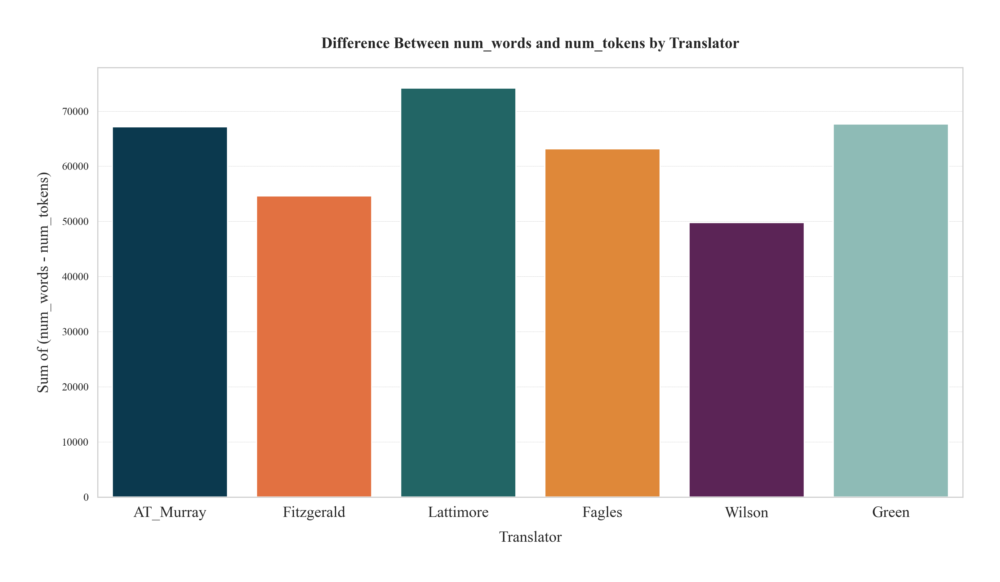

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df
df["diff"] = df["num_words"] - df["num_tokens"]

# Create the plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df, x="translator", y="diff", estimator=sum, ci=None)

# Customize labels
plt.xticks()
plt.xlabel("Translator")
plt.ylabel("Sum of (num_words - num_tokens)")
plt.title("Difference Between num_words and num_tokens by Translator")

# Show the plot
plt.show()

/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/3484247940.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x="translator", y="Count", hue="Metric", estimator=sum, ci=None)


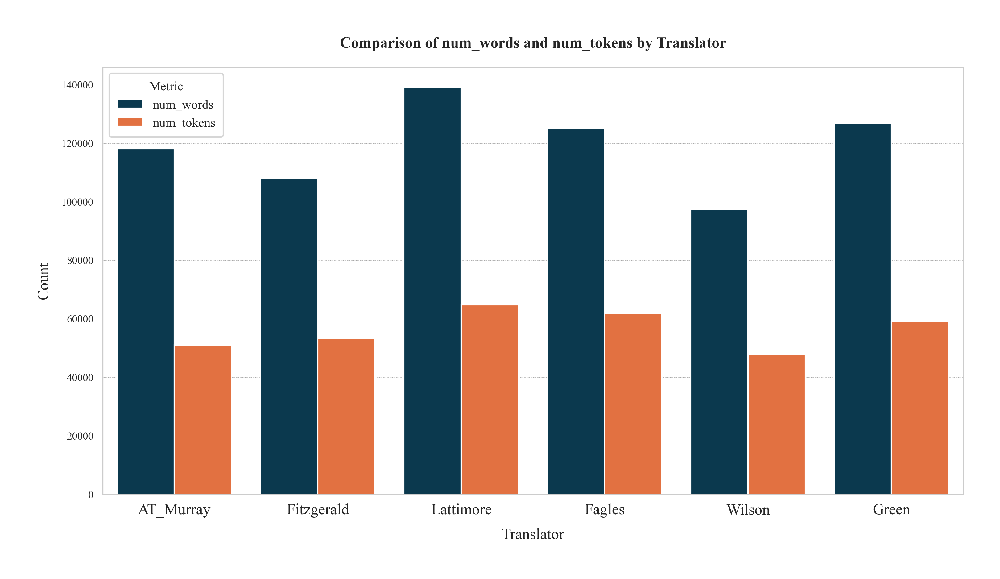

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df

# Reshape the DataFrame to a long format
df_melted = df.melt(id_vars=["translator"], value_vars=["num_words", "num_tokens"],
                     var_name="Metric", value_name="Count")

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df_melted, x="translator", y="Count", hue="Metric", estimator=sum, ci=None)

# Customize labels
plt.xticks(rotation=0)
plt.xlabel("Translator")
plt.ylabel("Count")
plt.title("Comparison of num_words and num_tokens by Translator")
plt.legend(title="Metric")

# Show the plot
plt.show()

In [63]:
df

63

In [13]:
df_melted.T

,0,1,2,3,4,5,6,7,8,9,...,278,279,280,281,282,283,284,285,286,287
translator,AT_Murray,AT_Murray,AT_Murray,AT_Murray,AT_Murray,AT_Murray,AT_Murray,AT_Murray,AT_Murray,AT_Murray,...,Green,Green,Green,Green,Green,Green,Green,Green,Green,Green
Metric,num_words,num_words,num_words,num_words,num_words,num_words,num_words,num_words,num_words,num_words,...,num_tokens,num_tokens,num_tokens,num_tokens,num_tokens,num_tokens,num_tokens,num_tokens,num_tokens,num_tokens
Count,4187,4245,4744,8132,4715,3470,3369,5652,5866,5731,...,2701,2268,2976,2123,2942,1930,2154,2429,1813,2651


We had missing values in some columns because not every translator's text had trigrams or first line column. The others are only inconsistencies in capitalization. However, all are columns we don't need, so those aren't included.

____________________________________________________
## 2️⃣ Experiment 1: **Type-Token Ratio (TTR)** 

# 📖 Lexical Diversity in *The Odyssey*: A Comparative Analysis of Green and Wilson’s Translations  

## ✨ Introduction  

**Type-Token Ratio (TTR)** is a key measure of lexical diversity, calculated as the number of unique words (**types**) divided by the total word count (**tokens**). It provides insight into a translator’s lexical choices when rendering the same source text.  

- A **higher TTR** suggests a richer vocabulary, possibly reflecting an effort to capture nuances or stylistic complexity.  
- A **lower TTR** may indicate a more repetitive or constrained word choice, potentially prioritizing accessibility or fidelity to the original.  

### 📌 **TTR Formula**  

$$TTR = \left( \frac{\text{Unique Words}}{\text{Total Words}} \right) \times 100$$  




In [22]:
# Compute type-token ratio (TTR) for each book
import scipy.stats as stats

# Compute TTR
df["ttr"] = df["tokens"].apply(lambda x: (len(set(x)) / len(x) * 100) if x else 0)

# Separate TTRs for the two translations
ttr_at_murray = df[df["translator"] == "AT_Murray"]["ttr"].tolist()
ttr_fitzgerald = df[df["translator"] == "Fitzgerald"]["ttr"].tolist()
ttr_lattimore = df[df["translator"] == "Lattimore"]["ttr"].tolist()
ttr_fagles = df[df["translator"] == "Fagles"]["ttr"].tolist()
ttr_wilson = df[df["translator"] == "Wilson"]["ttr"].tolist()
ttr_green = df[df["translator"] == "Green"]["ttr"].tolist()

In [23]:
ttr_values = [ttr_at_murray, ttr_fitzgerald, ttr_lattimore, ttr_fagles, ttr_wilson, ttr_green]

# ttr_ values to dataframe
ttr_df = pd.DataFrame(ttr_values).T
ttr_df.columns = translators
ttr_df

,AT_Murray,Fitzgerald,Lattimore,Fagles,Wilson,Green
0,0.181255,0.174425,0.138337,0.144144,0.202255,0.149680
1,0.180149,0.182951,0.144138,0.156418,0.212966,0.155604
2,0.150405,0.152657,0.123058,0.127811,0.170094,0.129886
3,0.092598,0.095023,0.073854,0.078339,0.107174,0.079365
4,0.160914,0.160056,0.122507,0.130055,0.178393,0.132714
5,0.219640,0.231834,0.185142,0.198167,0.264444,0.201283
6,0.217330,0.219584,0.172442,0.180546,0.257128,0.189540
7,0.129172,0.133311,0.103073,0.109428,0.150547,0.112640
8,0.132694,0.135731,0.106213,0.113210,0.149939,0.118086
9,0.135965,0.132681,0.107966,0.116152,0.152693,0.116780


In [25]:
print("\ndf columns:", ttr_df.columns, "\nShape:", ttr_df.shape)


df columns: Index(['AT_Murray', 'Fitzgerald', 'Lattimore', 'Fagles', 'Wilson', 'Green'], dtype='object') 
Shape: (24, 6)


/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/2537709833.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=ttr_df_sums.index, y=ttr_df_sums.values, estimator=sum, ci=None)
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/2537709833.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=i, y=ttr_df_sums[i], s=ttr_df_sums[i], ha = 'center')


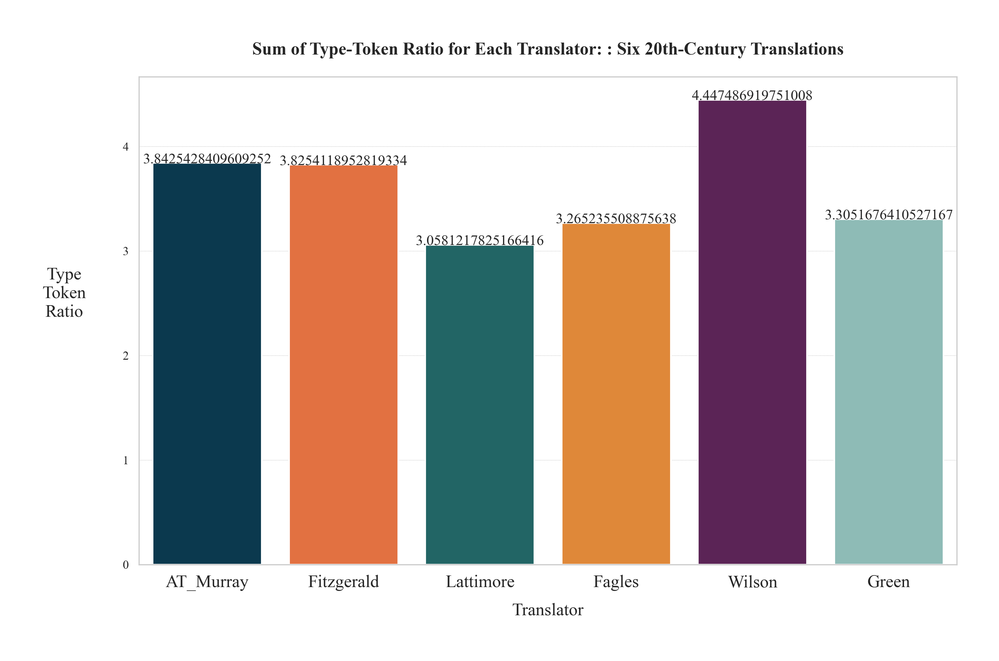

AT_Murray     3.842543
Fitzgerald    3.825412
Lattimore     3.058122
Fagles        3.265236
Wilson        4.447487
Green         3.305168
dtype: float64


In [41]:
# Sum each column
ttr_df_sums = ttr_df.sum()

# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=ttr_df_sums.index, y=ttr_df_sums.values, estimator=sum, ci=None)

# Customize labels
plt.xlabel("Translator")
# adding values to the bars
for i in range(len(ttr_df_sums)):
    plt.text(x=i, y=ttr_df_sums[i], s=ttr_df_sums[i], ha = 'center')
plt.xticks(rotation=0)
plt.ylabel("Type\nToken\nRatio", rotation=0, labelpad=40)
plt.title("Sum of Type-Token Ratio for Each Translator: : Six 20th-Century Translations")

# Show the plot
plt.show()
print(ttr_df_sums)

/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/598496744.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=ttr_df_sums.index, y=ttr_df_sums.values, estimator=sum, ci=None)
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/598496744.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=i, y=ttr_df_sums[i] + 0.05,  # Slightly offset text above the bar
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/598496744.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  s=round(ttr_df_sums[i], 2),   # Round t

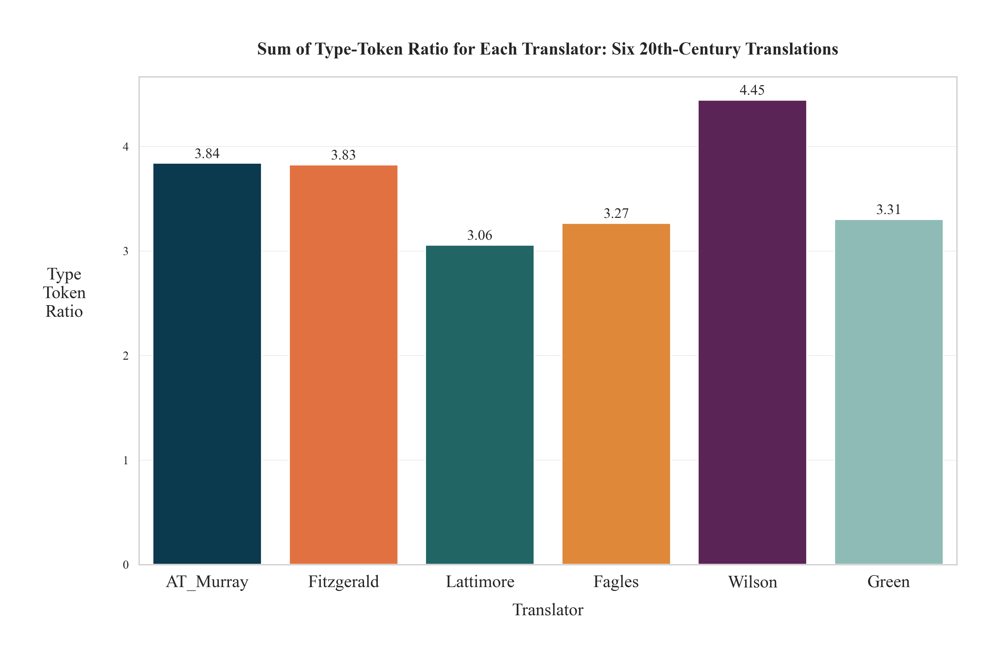

AT_Murray     3.842543
Fitzgerald    3.825412
Lattimore     3.058122
Fagles        3.265236
Wilson        4.447487
Green         3.305168
dtype: float64


In [43]:
# Sum each column
ttr_df_sums = ttr_df.sum()

# Create bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=ttr_df_sums.index, y=ttr_df_sums.values, estimator=sum, ci=None)

# Customize labels
plt.xlabel("Translator")

# Adding rounded values to the bars
for i in range(len(ttr_df_sums)):
    plt.text(x=i, y=ttr_df_sums[i] + 0.05,  # Slightly offset text above the bar
             s=round(ttr_df_sums[i], 2),   # Round to 2 decimal places
             ha='center')

plt.xticks(rotation=0)
plt.ylabel("Type\nToken\nRatio", rotation=0, labelpad=40)
plt.title("Sum of Type-Token Ratio for Each Translator: Six 20th-Century Translations")

# Show the plot
plt.show()
print(ttr_df_sums)

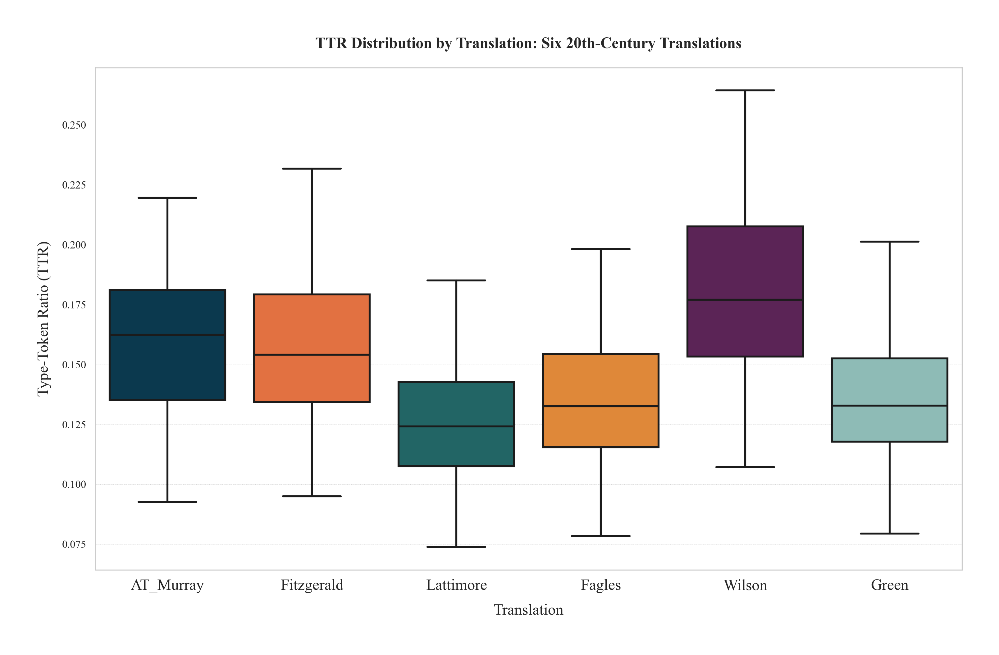

In [44]:
# Create a boxplot for TTR values
sns.boxplot(x=df["translator"], y=df["ttr"])
plt.title("TTR Distribution by Translation: Six 20th-Century Translations")
plt.xlabel("Translation")
plt.ylabel("Type-Token Ratio (TTR)")
##plt.savefig("/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/MVP-TTR_distribution.png")
plt.show()

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert in

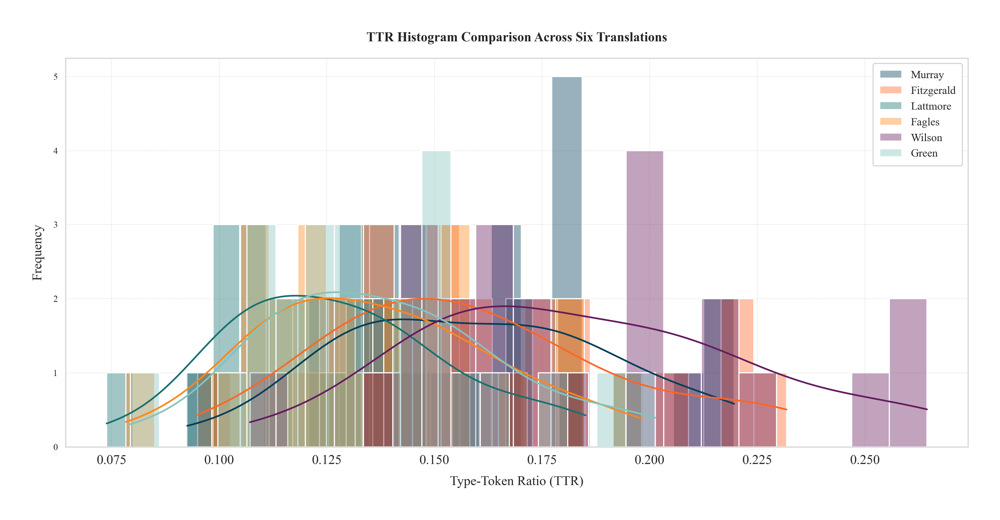

In [45]:
plt.figure(figsize=(12, 6))

sns.histplot(ttr_at_murray, bins=18, label="Murray", kde=True, alpha=0.4)
sns.histplot(ttr_fitzgerald, bins=18, label="Fitzgerald", kde=True, alpha=0.4)
sns.histplot(ttr_lattimore, bins=18, label="Lattmore", kde=True, alpha=0.4)
sns.histplot(ttr_fagles, bins=18, label="Fagles", kde=True, alpha=0.4)
sns.histplot(ttr_wilson, bins=18, label="Wilson", kde=True, alpha=0.4)
sns.histplot(ttr_green, bins=18, label="Green", kde=True, alpha=0.4)

plt.title("TTR Histogram Comparison Across Six Translations")
plt.xlabel("Type-Token Ratio (TTR)")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
# plt.savefig(f"{output_path_plots}/TTR_histogram_all_translators.png")
plt.show()

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert in

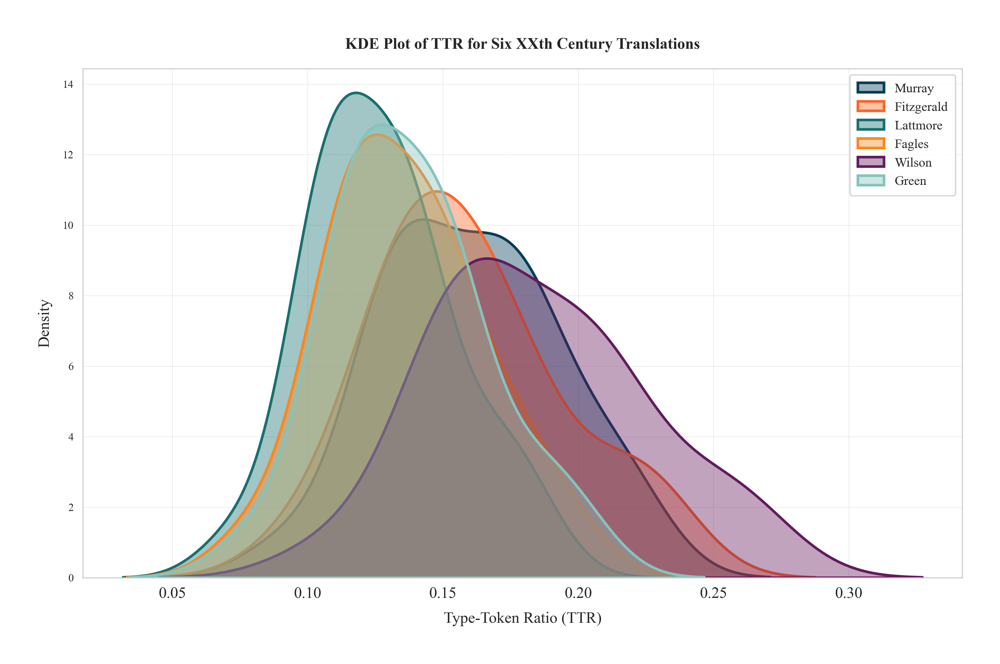

In [46]:
# KDE plot for Wilson and Green translations
sns.kdeplot(ttr_at_murray, fill=True, label="Murray", alpha=0.4, linewidth=2)
sns.kdeplot(ttr_fitzgerald, fill=True, label="Fitzgerald", alpha=0.4, linewidth=2)
sns.kdeplot(ttr_lattimore, fill=True, label="Lattmore", alpha=0.4, linewidth=2)
sns.kdeplot(ttr_fagles, fill=True, label="Fagles", alpha=0.4, linewidth=2)
sns.kdeplot(ttr_wilson, fill=True, label="Wilson", alpha=0.4, linewidth=2)
sns.kdeplot(ttr_green, fill=True, label="Green", alpha=0.4, linewidth=2)
plt.title("KDE Plot of TTR for Six XXth Century Translations")
plt.xlabel("Type-Token Ratio (TTR)")
plt.ylabel("Density")
plt.legend()
#plt.savefig("/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/MVP-TTR_kdeplot.png")
plt.show()

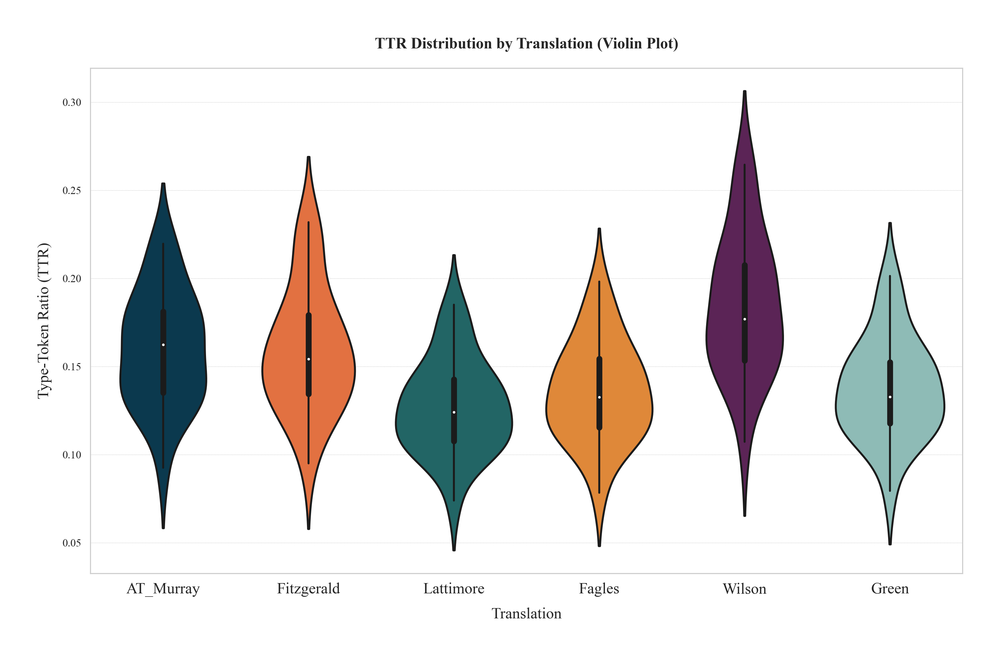

In [47]:
# Create a violin plot for TTR values
sns.violinplot(x=df["translator"], y=df["ttr"])
plt.title("TTR Distribution by Translation (Violin Plot)")
plt.xlabel("Translation")
plt.ylabel("Type-Token Ratio (TTR)")
#plt.savefig("/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/MVP-TTR_violinplot.png")
plt.show()

---

## 🎯 Hypothesis Testing  

To compare **Green and Wilson’s translations**, we define the following hypotheses:  

- **H₀ (Null Hypothesis):** No significant difference in lexical diversity between the translations.  
- **H₁ (Alternative Hypothesis):** A significant difference in lexical diversity exists.  

### 📊 **Statistical Approach**  

Given that the data is normally distributed, we employ a **t-test** to determine whether observed TTR differences are statistically meaningful:  

✅ If **p-value < 0.05**, we **reject H₀**, indicating a significant lexical difference.  
❌ If **p-value ≥ 0.05**, we **fail to reject H₀**, suggesting variations are not statistically significant.  



In [48]:
from scipy import stats

# Shapiro-Wilk test for ttr_values of translator data
stat_at_murray, p_value_at_murray = stats.shapiro(ttr_at_murray)
print(f"Shapiro-Wilk test for Murray's data: T-statistic={stat_at_murray}, p-value={p_value_at_murray}")

stat_fitzgerald, p_value_fitzgerald = stats.shapiro(ttr_fitzgerald)
print(f"Shapiro-Wilk test for Fitzgerald's data: T-statistic={stat_fitzgerald}, p-value={p_value_fitzgerald}")

stat_lattimore, p_value_lattimore = stats.shapiro(ttr_lattimore)
print(f"Shapiro-Wilk test for Lattimore's data: T-statistic={stat_lattimore}, p-value={p_value_lattimore}")

stat_fagles, p_value_fagles = stats.shapiro(ttr_fagles)
print(f"Shapiro-Wilk test for Fagles's data: T-statistic={stat_fagles}, p-value={p_value_fagles}")

stat_wilson, p_value_wilson = stats.shapiro(ttr_wilson)
print(f"Shapiro-Wilk test for Wilson's data: T-statistic={stat_wilson}, p-value={p_value_wilson}")

stat_green, p_value_green = stats.shapiro(ttr_green)
print(f"Shapiro-Wilk test for Green's data: T-statistic={stat_green}, p-value={p_value_green}")

# Interpretation of p-values
if p_value_at_murray < 0.05:
    print("Murray's TTR data is not normally distributed.")
else:
    print("Murray's TTR data is normally distributed.")

if p_value_fitzgerald < 0.05:
    print("Fitzgerald's TTR data is not normally distributed.")
else:
    print("Fitzgerald's TTR data is normally distributed.")

if p_value_lattimore < 0.05:
    print("Lattimore's TTR data is not normally distributed.")
else:
    print("Lattimore's TTR data is normally distributed.")

if p_value_fagles < 0.05:
    print("Fagles's TTR data is not normally distributed.")
else:
    print("Fagles's TTR data is normally distributed.")

if p_value_wilson < 0.05:
    print("Wilson's TTR data is not normally distributed.")
else:
    print("Wilson's TTR data is normally distributed.")

if p_value_green < 0.05:
    print("Green's TTR data is not normally distributed.")
else:
    print("Green's TTR data is normally distributed.")

Shapiro-Wilk test for Murray's data: T-statistic=0.9678015112876892, p-value=0.6130992770195007
Shapiro-Wilk test for Fitzgerald's data: T-statistic=0.9608145356178284, p-value=0.455007404088974
Shapiro-Wilk test for Lattimore's data: T-statistic=0.9693548083305359, p-value=0.6510738134384155
Shapiro-Wilk test for Fagles's data: T-statistic=0.9816978573799133, p-value=0.9249566197395325
Shapiro-Wilk test for Wilson's data: T-statistic=0.9666022658348083, p-value=0.5842757821083069
Shapiro-Wilk test for Green's data: T-statistic=0.9718750715255737, p-value=0.7133524417877197
Murray's TTR data is normally distributed.
Fitzgerald's TTR data is normally distributed.
Lattimore's TTR data is normally distributed.
Fagles's TTR data is normally distributed.
Wilson's TTR data is normally distributed.
Green's TTR data is normally distributed.


In [49]:
import scipy.stats as stats
import numpy as np
from itertools import combinations

# Define your ttr values
ttr_values = [ttr_at_murray, ttr_fitzgerald, ttr_lattimore, ttr_fagles, ttr_wilson, ttr_green]
translator_names = ["AT_Murray", "Fitzgerald", "Lattimore", "Fagles", "Wilson", "Green"]

# Perform one-way ANOVA
f_stat, p_value = stats.f_oneway(*ttr_values)
print(f"F-statistic: {f_stat}, P-value: {p_value}")

if p_value < 0.05:
    print("There are statistically significant differences in TTR among the translators.")
else:
    print("There are no statistically significant differences in TTR among the translators.")

# Perform pairwise t-tests with Bonferroni correction
print("\nPairwise comparisons:")
# Number of comparisons for Bonferroni correction
num_comparisons = len(list(combinations(range(len(translator_names)), 2)))

for i, j in combinations(range(len(translator_names)), 2):
    t_stat, p_val = stats.ttest_ind(ttr_values[i], ttr_values[j])
    # Apply Bonferroni correction
    adj_p_val = min(p_val * num_comparisons, 1.0)
    mean_diff = np.mean(ttr_values[i]) - np.mean(ttr_values[j])
    is_significant = "Significant" if adj_p_val < 0.05 else "Not significant"
    print(f"{translator_names[i]} vs {translator_names[j]}: Diff = {mean_diff:.4f}, p = {adj_p_val:.4f} - {is_significant}")

F-statistic: 10.682457476379902, P-value: 1.0823882270289951e-08
There are statistically significant differences in TTR among the translators.

Pairwise comparisons:
AT_Murray vs Fitzgerald: Diff = 0.0007, p = 1.0000 - Not significant
AT_Murray vs Lattimore: Diff = 0.0327, p = 0.0058 - Significant
AT_Murray vs Fagles: Diff = 0.0241, p = 0.1322 - Not significant
AT_Murray vs Wilson: Diff = -0.0252, p = 0.2942 - Not significant
AT_Murray vs Green: Diff = 0.0224, p = 0.2160 - Not significant
Fitzgerald vs Lattimore: Diff = 0.0320, p = 0.0130 - Significant
Fitzgerald vs Fagles: Diff = 0.0233, p = 0.2221 - Not significant
Fitzgerald vs Wilson: Diff = -0.0259, p = 0.3048 - Not significant
Fitzgerald vs Green: Diff = 0.0217, p = 0.3473 - Not significant
Lattimore vs Fagles: Diff = -0.0086, p = 1.0000 - Not significant
Lattimore vs Wilson: Diff = -0.0579, p = 0.0000 - Significant
Lattimore vs Green: Diff = -0.0103, p = 1.0000 - Not significant
Fagles vs Wilson: Diff = -0.0493, p = 0.0002 - Sig

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


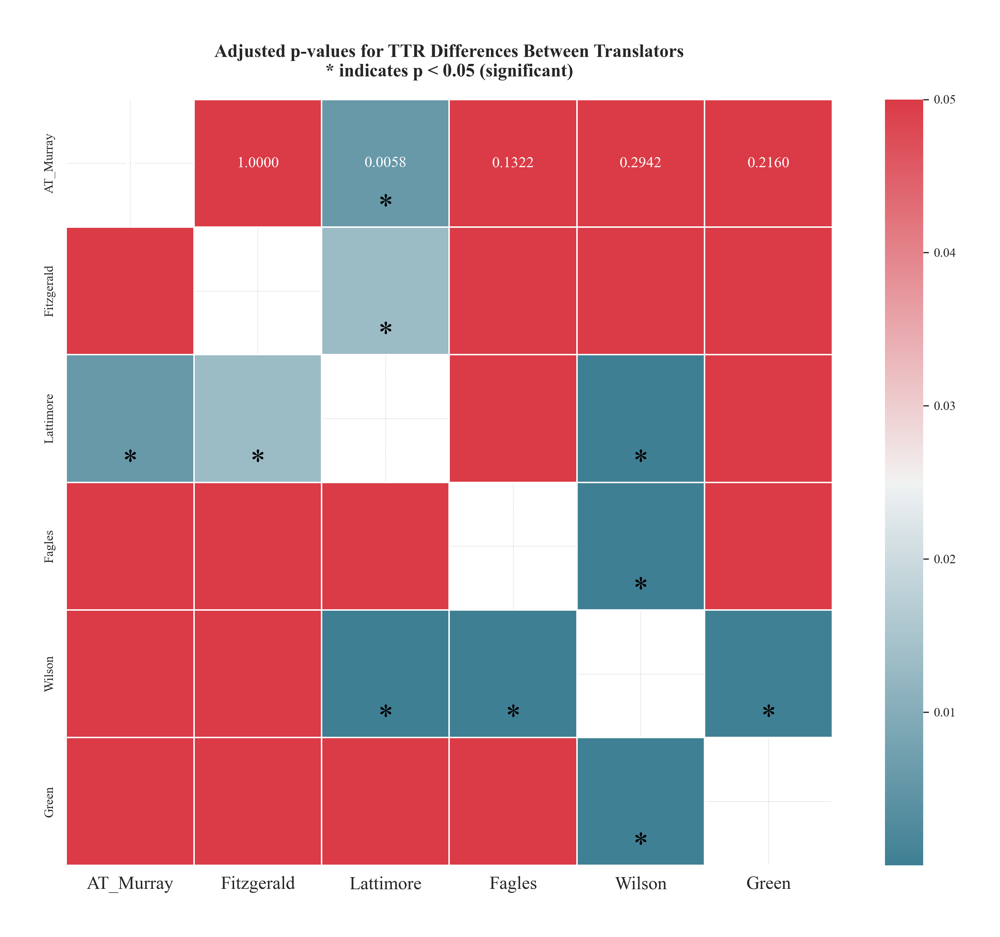

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


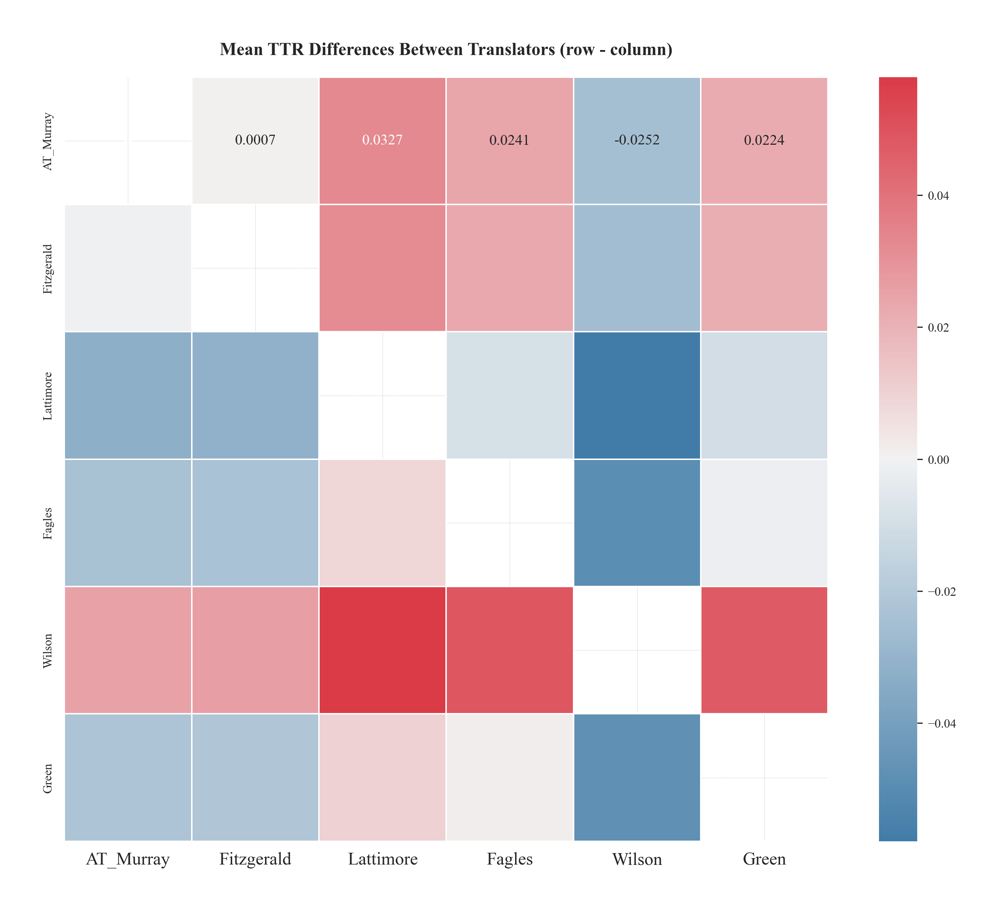

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from itertools import combinations

# Create empty matrices for p-values and mean differences
n = len(translator_names)
p_values = np.ones((n, n))
mean_diffs = np.zeros((n, n))
significance = np.zeros((n, n), dtype=bool)

# Fill matrices with results
for i, j in combinations(range(n), 2):
    t_stat, p_val = stats.ttest_ind(ttr_values[i], ttr_values[j])
    adj_p_val = min(p_val * num_comparisons, 1.0)
    diff = np.mean(ttr_values[i]) - np.mean(ttr_values[j])
    
    # Store values in matrices (both upper and lower triangles for visualization)
    p_values[i, j] = adj_p_val
    p_values[j, i] = adj_p_val
    mean_diffs[i, j] = diff
    mean_diffs[j, i] = -diff  # Opposite sign for the other direction
    significance[i, j] = adj_p_val < 0.05
    significance[j, i] = adj_p_val < 0.05

# Set diagonal to NaN to not show it in the heatmap
np.fill_diagonal(p_values, np.nan)

# Create p-value heatmap
plt.figure(figsize=(10, 8))
mask = np.isnan(p_values)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
ax = sns.heatmap(p_values, 
                mask=mask,
                cmap=cmap,
                vmax=0.05,
                center=0.025,
                square=True, 
                linewidths=.5, 
                annot=True, 
                fmt='.4f',
                xticklabels=translator_names, 
                yticklabels=translator_names)

# Add asterisks for significant differences
for i in range(n):
    for j in range(n):
        if not np.isnan(p_values[i, j]) and significance[i, j]:
            ax.text(j + 0.5, i + 0.85, '*', 
                   color='black', ha='center', va='center', fontsize=20)

plt.title('Adjusted p-values for TTR Differences Between Translators\n* indicates p < 0.05 (significant)', fontsize=12)
plt.tight_layout()
#plt.savefig(f"{output_path_plots}/TTR_pvalue_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()

# Create mean difference heatmap
plt.figure(figsize=(10, 8))
np.fill_diagonal(mean_diffs, np.nan)
mask = np.isnan(mean_diffs)
cmap = sns.diverging_palette(240, 10, as_cmap=True)  # Blue-white-red
sns.heatmap(mean_diffs, 
           mask=mask,
           cmap=cmap,
           center=0,
           square=True, 
           linewidths=.5, 
           annot=True, 
           fmt='.4f',
           xticklabels=translator_names, 
           yticklabels=translator_names)

plt.title('Mean TTR Differences Between Translators (row - column)', fontsize=12)
plt.tight_layout()
#plt.savefig(f"{output_path_plots}/TTR_meandiff_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Perform t-test
t_stat, p_value = stats.ttest_ind(ttr_wilson, ttr_green)
print(f"T-statistic: {t_stat}, P-value: {p_value}")
if p_value < 0.05:
    print("The difference in TTR between Wilson and Green is statistically significant.")
else:
    print("The difference in TTR between Wilson and Green is not statistically significant.")

### 📖 **Results Discussion of Type-Token Ratio (TTR) in Green and Wilson’s Translations**

📊 **Statistical Findings and Interpretation**

The t-test comparing TTR values between Wilson’s and Green’s translations found no statistically significant difference (p ≥ 0.05). This supports the null hypothesis (H₀): their lexical diversity is quantitatively similar. Rather than being inconclusive, this result provides a crucial insight:

**Both translators operate within the same cultural and linguistic framework, which strongly influences their word choices.**


________________________________
## 🏛 **Experiment 2: Zipf’s Law Verification**

Zipf’s Law is relevant in comparing translations because it reveals how each translator balances **common vs. rare words**, shedding light on **lexical richness and stylistic choices**. A strong adherence to Zipf’s distribution suggests a **natural linguistic flow**, while deviations may indicate a preference for formal fidelity, accessibility, or poetic stylization. By analyzing Zipfian patterns, we can assess whether Green and Wilson’s translations **preserve the frequency structure of the original text or introduce shifts** in word usage and emphasis.

🔬 **Implementation**

To examine how Green and Wilson’s translations adhere to Zipf’s Law, we analyze the relationship between word frequency and rank:

1️⃣ Compute word frequencies for each translation.  
2️⃣ Rank words from most to least frequent.  
3️⃣ Plot word frequency vs. rank on a log-log scale.  

📊 **Zipf’s Law in Translation**

Zipf’s Law states that in any natural language corpus, the frequency of a word is inversely proportional to its rank:


$$ f \propto \frac{1}{r} $$

Where:
* f = frequency of the word
* r = rank of the word (1st most frequent, 2nd most frequent, etc.)

If Green and Wilson’s translations follow Zipf’s distribution, their word frequency curves should approximate a straight line in a log-log plot.

🔍 **Implications for Translation Studies**

✅ Strong Zipfian adherence suggests that both translators maintain natural language patterns, balancing high-frequency function words with low-frequency content words.  

📖 Deviations may indicate differences in lexical richness, syntactic choices, or stylistic adaptation in translation.

This experiment provides empirical insight into whether Green and Wilson’s lexical distributions align with universal linguistic principles.

In [52]:
# Flatten all tokens into a single list for each translator
tokens_at_murray = [token for tokens in df[df["translator"] == "AT_Murray"]["tokens"] for token in tokens]
tokens_fitzgerald = [token for tokens in df[df["translator"] == "Fitzgerald"]["tokens"] for token in tokens]
tokens_lattimore = [token for tokens in df[df["translator"] == "Lattimore"]["tokens"] for token in tokens]
tokens_fagles = [token for tokens in df[df["translator"] == "Fagles"]["tokens"] for token in tokens]
tokens_wilson = [token for tokens in df[df["translator"] == "Wilson"]["tokens"] for token in tokens]
tokens_green = [token for tokens in df[df["translator"] == "Green"]["tokens"] for token in tokens]

# Count word frequencies
freq_at_murray = Counter(tokens_at_murray)
freq_fitzgerald = Counter(tokens_fitzgerald)
freq_lattimore = Counter(tokens_lattimore)
freq_fagles = Counter(tokens_fagles)
freq_wilson = Counter(tokens_wilson)
freq_green = Counter(tokens_green)

# Convert to DataFrame with ranks

df_zipf_at_murray = pd.DataFrame(freq_at_murray.items(),
                                 columns=["word", "frequency"]).sort_values(by="frequency", ascending=False)
df_zipf_at_murray["rank"] = df_zipf_at_murray["frequency"].rank(method="first", ascending=False)

df_zipf_fitzgerald = pd.DataFrame(freq_fitzgerald.items(),
                                 columns=["word", "frequency"]).sort_values(by="frequency", ascending=False)
df_zipf_fitzgerald["rank"] = df_zipf_fitzgerald["frequency"].rank(method="first", ascending=False)

df_zipf_lattimore = pd.DataFrame(freq_lattimore.items(),
                                 columns=["word", "frequency"]).sort_values(by="frequency", ascending=False)
df_zipf_lattimore["rank"] = df_zipf_lattimore["frequency"].rank(method="first", ascending=False)

df_zipf_fagles = pd.DataFrame(freq_fagles.items(),
                              columns=["word", "frequency"]).sort_values(by="frequency", ascending=False)
df_zipf_fagles["rank"] = df_zipf_fagles["frequency"].rank(method="first", ascending=False)

df_zipf_wilson = pd.DataFrame(freq_wilson.items(), 
                              columns=["word", "frequency"]).sort_values(by="frequency", ascending=False)
df_zipf_wilson["rank"] = df_zipf_wilson["frequency"].rank(method="first", ascending=False)

df_zipf_green = pd.DataFrame(freq_green.items(), 
                             columns=["word", "frequency"]).sort_values(by="frequency", ascending=False)
df_zipf_green["rank"] = df_zipf_green["frequency"].rank(method="first", ascending=False)

In [55]:
# Find the min and max values across all translators
min_rank = min(
    df_zipf_at_murray["rank"].min(),
    df_zipf_fitzgerald["rank"].min(),
    df_zipf_lattimore["rank"].min(),
    df_zipf_fagles["rank"].min(),
    df_zipf_wilson["rank"].min(),
    df_zipf_green["rank"].min()
)

max_rank = max(
    df_zipf_at_murray["rank"].max(),
    df_zipf_fitzgerald["rank"].max(),
    df_zipf_lattimore["rank"].max(),
    df_zipf_fagles["rank"].max(),
    df_zipf_wilson["rank"].max(),
    df_zipf_green["rank"].max()
)

min_freq = min(
    df_zipf_at_murray["frequency"].min(),
    df_zipf_fitzgerald["frequency"].min(),
    df_zipf_lattimore["frequency"].min(),
    df_zipf_fagles["frequency"].min(),
    df_zipf_wilson["frequency"].min(),
    df_zipf_green["frequency"].min()
)

max_freq = max(
    df_zipf_at_murray["frequency"].max(),
    df_zipf_fitzgerald["frequency"].max(),
    df_zipf_lattimore["frequency"].max(),
    df_zipf_fagles["frequency"].max(),
    df_zipf_wilson["frequency"].max(),
    df_zipf_green["frequency"].max()
)

print(f"Rank range: {min_rank} to {max_rank}")
print(f"Frequency range: {min_freq} to {max_freq}")

Rank range: 1.0 to 35.0
Frequency range: 3 to 129794


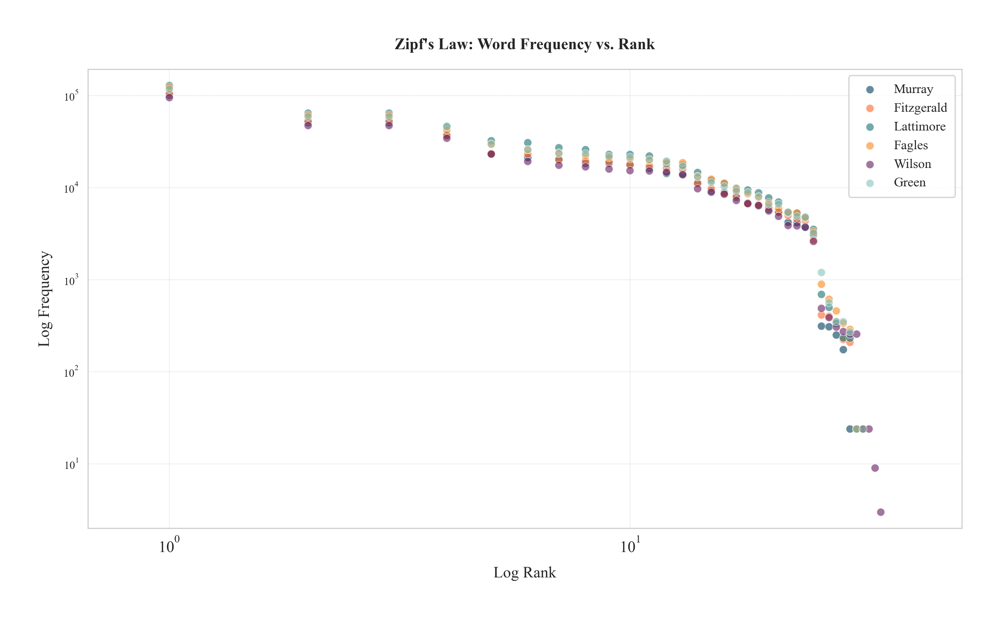

In [58]:
plt.figure(figsize=(10, 6))

# Plot all six translators
sns.scatterplot(x=df_zipf_at_murray["rank"], y=df_zipf_at_murray["frequency"], label="Murray", alpha=0.6)
sns.scatterplot(x=df_zipf_fitzgerald["rank"], y=df_zipf_fitzgerald["frequency"], label="Fitzgerald", alpha=0.6)
sns.scatterplot(x=df_zipf_lattimore["rank"], y=df_zipf_lattimore["frequency"], label="Lattimore", alpha=0.6)
sns.scatterplot(x=df_zipf_fagles["rank"], y=df_zipf_fagles["frequency"], label="Fagles", alpha=0.6)
sns.scatterplot(x=df_zipf_wilson["rank"], y=df_zipf_wilson["frequency"], label="Wilson", alpha=0.6)
sns.scatterplot(x=df_zipf_green["rank"], y=df_zipf_green["frequency"], label="Green", alpha=0.6)

# Set log scales
plt.xscale("log")
plt.yscale("log")

# Set limits based on the data with a small buffer (multiply/divide by 1.1 to add 10% buffer)
plt.xlim(min_rank/1.5, max_rank*1.5)
plt.ylim(min_freq/1.5, max_freq*1.5)

# Labels and title
plt.xlabel("Log Rank")
plt.ylabel("Log Frequency")
plt.title("Zipf's Law: Word Frequency vs. Rank")
plt.legend()
plt.tight_layout()
# plt.savefig(f"{output_path_plots}/Zipf_distribution_all_translators.png", dpi=300)
plt.show()

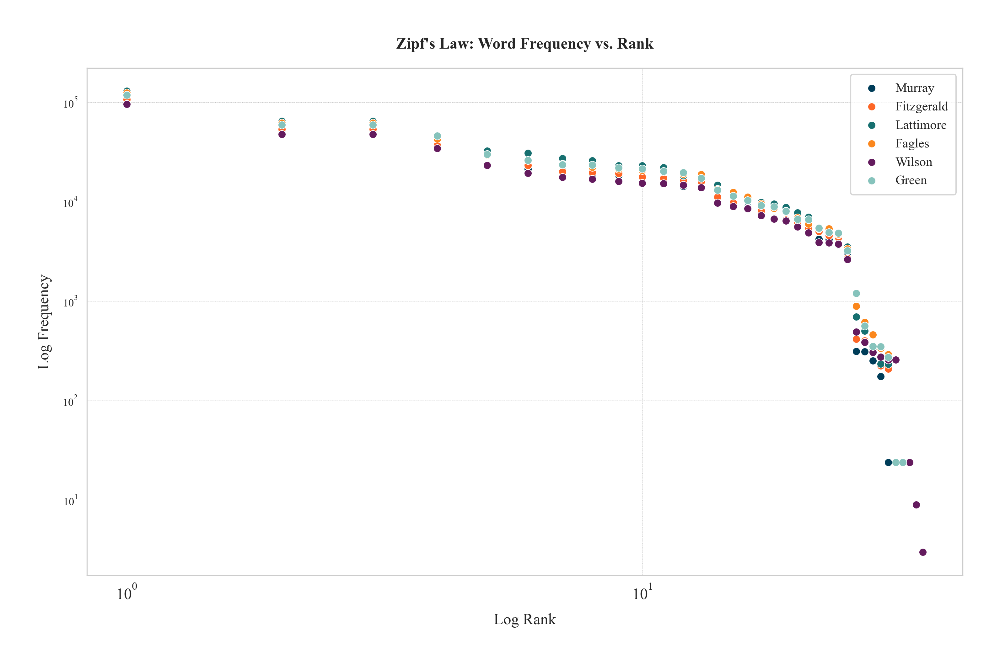

In [53]:
# Plot Wilson and Green's Zipf distribution
sns.scatterplot(x=df_zipf_at_murray["rank"], y=df_zipf_at_murray["frequency"], label="Murray")
sns.scatterplot(x=df_zipf_fitzgerald["rank"], y=df_zipf_fitzgerald["frequency"], label="Fitzgerald")
sns.scatterplot(x=df_zipf_lattimore["rank"], y=df_zipf_lattimore["frequency"], label="Lattimore")
sns.scatterplot(x=df_zipf_fagles["rank"], y=df_zipf_fagles["frequency"], label="Fagles")
sns.scatterplot(x=df_zipf_wilson["rank"], y=df_zipf_wilson["frequency"], label="Wilson")
sns.scatterplot(x=df_zipf_green["rank"], y=df_zipf_green["frequency"], label="Green")

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Log Rank")
plt.ylabel("Log Frequency")
plt.title("Zipf's Law: Word Frequency vs. Rank")
plt.legend()
#plt.savefig("/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/MVP-Zipf_distribution.png")
plt.show()

#### **Statistical Test for Zipf’s Law (Linear Fit)**

AT_Murray: Slope = -1.88, R² = 0.577, p-value = 7.12e-07
AT_Murray's translation deviates from Zipf's Law.
--------------------------------------------------
Fitzgerald: Slope = -1.91, R² = 0.596, p-value = 2.25e-07
Fitzgerald's translation deviates from Zipf's Law.
--------------------------------------------------
Lattimore: Slope = -1.95, R² = 0.588, p-value = 3.03e-07
Lattimore's translation deviates from Zipf's Law.
--------------------------------------------------
Fagles: Slope = -1.88, R² = 0.589, p-value = 2.94e-07
Fagles's translation deviates from Zipf's Law.
--------------------------------------------------
Wilson: Slope = -2.27, R² = 0.579, p-value = 1.1e-07
Wilson's translation deviates from Zipf's Law.
--------------------------------------------------
Green: Slope = -1.88, R² = 0.587, p-value = 3.19e-07
Green's translation deviates from Zipf's Law.
--------------------------------------------------

Summary of Zipf's Law Analysis:
   Translator     Slope        R²     

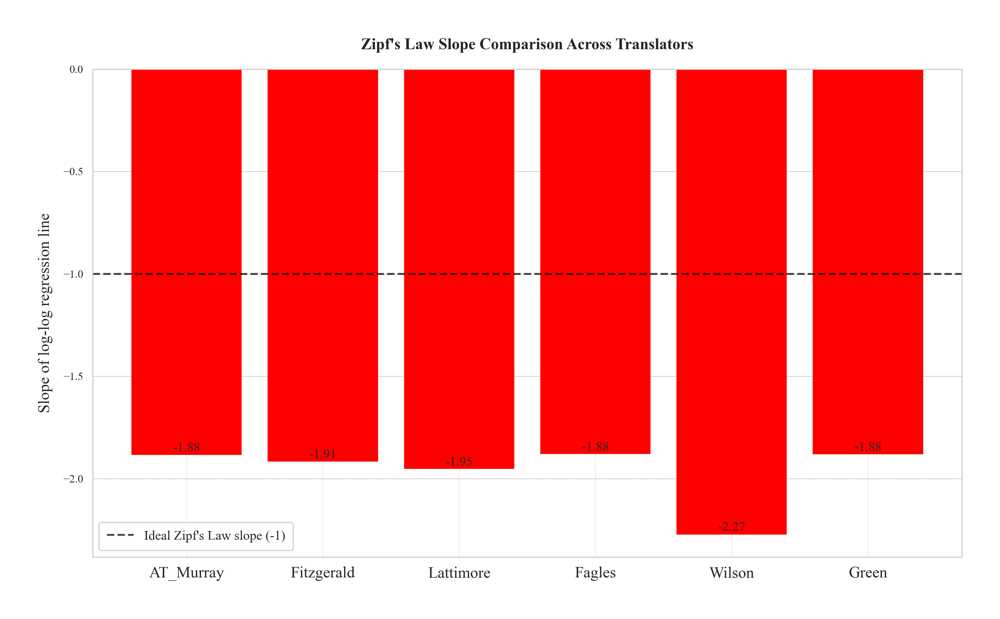


Statistical comparison of slopes:
AT_Murray vs Fitzgerald: Slope diff = 0.032, p = 0.9378
   -> No statistically significant difference in slopes
AT_Murray vs Lattimore: Slope diff = 0.069, p = 0.8712
   -> No statistically significant difference in slopes
AT_Murray vs Fagles: Slope diff = -0.004, p = 0.9925
   -> No statistically significant difference in slopes
AT_Murray vs Wilson: Slope diff = 0.389, p = 0.3911
   -> No statistically significant difference in slopes
AT_Murray vs Green: Slope diff = -0.003, p = 0.9944
   -> No statistically significant difference in slopes
Fitzgerald vs Lattimore: Slope diff = 0.036, p = 0.9305
   -> No statistically significant difference in slopes
Fitzgerald vs Fagles: Slope diff = -0.036, p = 0.9289
   -> No statistically significant difference in slopes
Fitzgerald vs Wilson: Slope diff = 0.356, p = 0.4239
   -> No statistically significant difference in slopes
Fitzgerald vs Green: Slope diff = -0.035, p = 0.9309
   -> No statistically significan

In [64]:
from scipy.stats import linregress
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# List of translator names and their dataframes
translators = ["AT_Murray", "Fitzgerald", "Lattimore", "Fagles", "Wilson", "Green"]
zipf_dfs = [df_zipf_at_murray, df_zipf_fitzgerald, df_zipf_lattimore, df_zipf_fagles, df_zipf_wilson, df_zipf_green]

# Create empty lists to store results
slopes = []
r_squared = []
p_values = []
std_errs = []
follows_zipf = []

# Perform linear regression in log-log space for each translator
for i, translator in enumerate(translators):
    log_rank = np.log(zipf_dfs[i]["rank"])
    log_freq = np.log(zipf_dfs[i]["frequency"])
    slope, intercept, r_value, p_value, std_err = linregress(log_rank, log_freq)
    
    # Store results
    slopes.append(slope)
    r_squared.append(r_value**2)
    p_values.append(p_value)
    std_errs.append(std_err)
    follows_zipf.append(-1.2 < slope < -0.8)
    
    # Display individual results
    print(f"{translator}: Slope = {slope:.2f}, R² = {r_value**2:.3f}, p-value = {p_value:.3g}")
    
    # Check if slope is close to -1 (Zipf's Law predicts ~ -1)
    if -1.2 < slope < -0.8:
        print(f"{translator}'s translation follows Zipf's Law.")
    else:
        print(f"{translator}'s translation deviates from Zipf's Law.")
    print("-" * 50)

# Create a summary dataframe
results_df = pd.DataFrame({
    'Translator': translators,
    'Slope': slopes,
    'R²': r_squared,
    'p-value': p_values,
    'Std Error': std_errs,
    'Follows Zipf\'s Law': follows_zipf
})

print("\nSummary of Zipf's Law Analysis:")
print(results_df)

# Create a bar chart to visualize slopes
plt.figure(figsize=(10, 6))
bars = plt.bar(translators, slopes)

# Color the bars based on whether they follow Zipf's Law
for i, follows in enumerate(follows_zipf):
    bars[i].set_color('green' if follows else 'red')

# Add a horizontal line at -1 (ideal Zipf's Law slope)
plt.axhline(y=-1, color='black', linestyle='--', alpha=0.7, label="Ideal Zipf's Law slope (-1)")

# Add value labels on top of bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
            f'{slopes[i]:.2f}',
            ha='center', va='bottom' if height < 0 else 'top', 
            rotation=0)

plt.title("Zipf's Law Slope Comparison Across Translators")
plt.ylabel("Slope of log-log regression line")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
# plt.savefig(f"{output_path_plots}/Zipf_slope_comparison.png", dpi=300)
plt.show()

# Statistical comparison of slopes (using confidence intervals)
print("\nStatistical comparison of slopes:")
for i in range(len(translators)):
    for j in range(i+1, len(translators)):
        # Calculate standard error of the difference between slopes
        se_diff = np.sqrt(std_errs[i]**2 + std_errs[j]**2)
        
        # Calculate t-statistic
        t_stat = (slopes[i] - slopes[j]) / se_diff
        
        # Calculate degrees of freedom (approximation)
        d_freedom = len(zipf_dfs[i]["rank"]) + len(zipf_dfs[j]["rank"]) - 4
        
        # Calculate p-value
        from scipy.stats import t
        p_val = 2 * (1 - t.cdf(abs(t_stat), d_freedom))
        
        print(f"{translators[i]} vs {translators[j]}: Slope diff = {slopes[i]-slopes[j]:.3f}, p = {p_val:.4f}")
        if p_val < 0.05:
            print("   -> Statistically significant difference in slopes")
        else:
            print("   -> No statistically significant difference in slopes")

---

## 🎯 Zipf's Law Hypothesis Testing  

#### **Statistical Test for Differences in Zipf Slopes**

In [ ]:
from scipy.stats import ttest_ind

# Compute t-test for the difference in slopes
t_stat, p_value = ttest_ind([slope_w], [slope_g])
print(f"T-statistic: {t_stat:.3f}, P-value: {p_value:.5f}")

# Interpretation
if p_value < 0.05:
    print("The difference in Zipf's Law slopes between Wilson and Green is statistically significant.")
else:
    print("No significant difference in Zipf's Law slopes between Wilson and Green.")

#### **Bootstrapped Confidence Intervals**

In [ ]:
# Function to bootstrap slope estimates
def bootstrap_slopes(log_rank, log_freq, num_samples=1000):
    slopes = []
    for _ in range(num_samples):
        sample_indices = np.random.choice(len(log_rank), 
                                          len(log_rank), 
                                          replace=True)
        slope, _, _, _, _ = linregress(log_rank[sample_indices], 
                                       log_freq[sample_indices])
        slopes.append(slope)
    return np.array(slopes)

# Bootstrap slopes for both translations
bootstrap_slopes_w = bootstrap_slopes(log_rank_w, log_freq_w)
bootstrap_slopes_g = bootstrap_slopes(log_rank_g, log_freq_g)

# Compute 95% confidence intervals
ci_w = np.percentile(bootstrap_slopes_w, [2.5, 97.5])
ci_g = np.percentile(bootstrap_slopes_g, [2.5, 97.5])

print(f"Wilson's slope 95% CI: {ci_w}")
print(f"Green's slope 95% CI: {ci_g}")

# Check if CIs overlap
if (ci_w[0] > ci_g[1]) or (ci_g[0] > ci_w[1]):
    print("Statistically significant difference between the two Zipf slopes.")
else:
    print("No significant difference between the two Zipf slopes.")

In [ ]:
# Plot histograms for bootstrapped slopes
sns.histplot(bootstrap_slopes_w, bins=30, kde=True, label="Wilson", alpha=0.5)
sns.histplot(bootstrap_slopes_g, bins=30, kde=True, label="Green", alpha=0.5)
plt.axvline(np.mean(bootstrap_slopes_w), linestyle="--",
                                        color="#003D59",  
                                        label=f"Wilson Mean: {np.mean(bootstrap_slopes_w):.2f}")
plt.axvline(np.mean(bootstrap_slopes_g), linestyle="--", 
                                        color='#FD6626', 
                                        label=f"Green Mean: {np.mean(bootstrap_slopes_g):.2f}")
plt.xlabel("Bootstrapped Slope Estimates")
plt.ylabel("Density")
plt.title("Bootstrapped Distributions of Zipf's Law Slopes")
plt.legend()
#plt.savefig("/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/MVP-Zipf_bootstrap.png")
plt.show()

**Zipf's Law Results**

The nearly identical 95% confidence intervals for Wilson’s and Green’s Zipfian slopes indicate that **both translations follow similar word frequency distributions.** This suggests that, **despite potential stylistic differences, both translators adhere to the natural statistical structure of language,** maintaining a comparable balance between common and rare words. 

The lack of a significant difference reinforces the idea that **shared cultural and linguistic contexts influence their lexical choices,** resulting in translations that align closely in terms of frequency distribution and overall lexical economy.

____________________________________________________
## 4️⃣ Experiment 3: **TF-IDF Analysis**  

### **Proving my stpe by step impementation with Wilson's Odyssey**
#### **STEP 1. Term Frequency (TF) Calculation** 

Term Frequency measures how frequently a term appears in a document. It is calculated as:

$$TF(t,d) = \frac{\text{Number of times term } t \text{ appears in document } d}{\text{Total number of terms in document } d}$$

This normalizes term counts by document length, ensuring that longer documents don't get artificially higher weights.

### **Inverse Document Frequency (IDF) Calculation**

IDF measures how important a term is by examining how rare it is across all documents:


$$IDF(t) = \log\left(\frac{N}{1 + \text{doc count}}\right)$$

Terms that appear in many documents receive lower IDF scores, reducing their importance in the final TF-IDF score.

### **TF-IDF Calculation**

TF-IDF combines Term Frequency and Inverse Document Frequency to weight terms based on both their importance in a specific document and their distinctiveness across the corpus:

$$TF\text{-}IDF(t,d) = TF(t,d) \times IDF(t)$$

Terms with high TF-IDF scores appear frequently in a specific document but rarely in other documents, making them likely more important for that document's content.

### **E2E TF-IDF Function & Visualization**
#### **Green's Odyssey** 
**(My version of) The algorithm**

The function defines a set of steps for **processing text data** (token lists) and **calculating the TF-IDF score**. It enables **automation and reusability**, making it a procedural method to derive meaningful text-based features from raw text.


In [67]:
df.head(2)

,translator,year,book_num,tokens,num_words,num_tokens
0,AT_Murray,1919,1,"['tell', 'muse', 'manysided', 'hero', 'travele...",4187,1800
1,AT_Murray,1919,2,"['child', 'morning', 'rosyfingered', 'dawn', '...",4245,1816


In [69]:
df["book_id"] = df["book_num"].astype(str) + '_' + df["translator"]
df

,translator,year,book_num,tokens,num_words,num_tokens,book_id
0,AT_Murray,1919,1,"['tell', 'muse', 'manysided', 'hero', 'travele...",4187,1800,1_AT_Murray
1,AT_Murray,1919,2,"['child', 'morning', 'rosyfingered', 'dawn', '...",4245,1816,2_AT_Murray
2,AT_Murray,1919,3,"['sun', 'rising', 'fair', 'sea', 'firmament', ...",4744,2146,3_AT_Murray
3,AT_Murray,1919,4,"['reached', 'low', 'lying', 'city', 'lacedaemo...",8132,3532,4_AT_Murray
4,AT_Murray,1919,5,"['dawn', 'rose', 'couch', 'beside', 'tithonos'...",4715,2067,5_AT_Murray
...,...,...,...,...,...,...,...
139,Green,2018,20,"['noble', 'odysseus', 'bedded', 'sleep', 'fore...",4129,1930,20_Green
140,Green,2018,21,"['goddess', 'grey-eyed', 'athene', 'put', 'min...",4650,2154,21_Green
141,Green,2018,22,"['resourceful', 'odysseus', 'stripped', 'rags'...",5260,2429,22_Green
142,Green,2018,23,"['chuckling', 'old', 'woman', 'ascended', 'upp...",3955,1813,23_Green


In [71]:
import pandas as pd
import numpy as np
from collections import Counter

def calculate_tfidf(df):
    """
    Calculate TF-IDF scores for a DataFrame with book_id and tokens columns.
    
    Parameters:
    -----------
    df : pandas DataFrame
        A DataFrame with 'book_id' and 'tokens' columns. 
        The 'tokens' column should contain lists of tokens (as strings or actual lists).
    
    Returns:
    --------
    pandas DataFrame
        The original DataFrame with additional columns:
        - term_freq: Dictionary of term frequencies for each token
        - term_counts: Dictionary of raw counts for each token
        - idf: Dictionary of IDF scores for each token
        - tf_idf: Dictionary of TF-IDF scores for each token
    """
    # Create a copy of the DataFrame to avoid modifying the original
    result_df = df.copy()
    
    # Function to compute term frequency and term counts
    def term_freq_by_doc(list_of_tokens):
        # Handle both string representation of list and actual list
        if isinstance(list_of_tokens, str):
            token_list = eval(list_of_tokens)  # Convert string representation to list
        else:
            token_list = list_of_tokens  # 
        
        # Count occurrences of each term
        term_counts = Counter(token_list)
        
        # Total number of terms in the document
        total_terms = len(token_list)
        
        # Compute TF: term frequency for each token
        term_freq = {term: count / total_terms for term, count in term_counts.items()}
        
        return term_freq, term_counts
    
    # Apply function to compute TF for each book
    result_df["term_freq"], result_df["term_counts"] = zip(*result_df["tokens"].apply(term_freq_by_doc))
    
    # Get total number of documents (books)
    N = len(result_df)
    
    # Count how many documents contain each term
    doc_containing_term = Counter()
    for term_counts in result_df["term_freq"]:
        doc_containing_term.update(term_counts.keys())  # Count unique terms in each document
    
    # Compute IDF for each term
    idf_scores = {term: np.log(N / (1 + doc_count)) for term, doc_count in doc_containing_term.items()}  # Adding 1 to avoid division by zero
    
    # Add IDF column to df
    result_df["idf"] = result_df["term_freq"].apply(lambda term_freq: {term: idf_scores[term] for term in term_freq})
    
    # Compute TF-IDF by multiplying TF and IDF for each term in each document
    result_df["tf_idf"] = result_df.apply(lambda row: {term: row["term_freq"][term] * row["idf"][term] for term in row["term_freq"]}, axis=1)
    
    return result_df

df_tfidf = calculate_tfidf(df)
df_tfidf[["book_id","tf_idf"]].head(2)

,book_id,tf_idf
0,1_AT_Murray,"{'tell': 0.0, 'muse': 0.0012206803207423442, '..."
1,2_AT_Murray,"{'child': 0.0002866553945635094, 'morning': 0...."


In [72]:
# Top terms for each book and heatmap plot
from matplotlib.colors import LinearSegmentedColormap
def extract_top_terms(df, n=50):
    """
    Extract the top N most important terms from the tf_idf column
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame with 'book_id' and 'tf_idf' columns
    n : int
        Number of top terms to extract (default: 50)
    
    Returns:
    --------
    tuple
        (top_terms_per_book, top_terms_overall)
        - top_terms_per_book: DataFrame with top terms for each book
        - top_terms_overall: DataFrame with top terms across all books
    """
    # Extract top terms per book
    top_terms_per_book = {}
    
    for _, row in df.iterrows():
        book_id = row['book_id']
        tf_idf_dict = row['tf_idf']
        
        # Sort terms by tf-idf score (descending) and take top N
        sorted_terms = sorted(tf_idf_dict.items(), key=lambda x: x[1], reverse=True)[:n]
        top_terms_per_book[book_id] = {term: score for term, score in sorted_terms}
    
    # Convert to DataFrame for easier analysis
    top_terms_df = pd.DataFrame.from_dict(top_terms_per_book, orient='index')
    
    # Extract top terms overall
    all_terms = {}
    for tf_idf_dict in df['tf_idf']:
        for term, score in tf_idf_dict.items():
            if term in all_terms:
                all_terms[term] += score
            else:
                all_terms[term] = score
    
    # Sort terms by total tf-idf score (descending) and take top N
    top_terms_overall = sorted(all_terms.items(), key=lambda x: x[1], reverse=True)[:n]
    
    # Convert to DataFrame
    top_terms_overall_df = pd.DataFrame(top_terms_overall, columns=['term', 'total_score'])
    
    return top_terms_df, top_terms_overall_df

top_terms_per_book, top_terms_overall = extract_top_terms(df_tfidf, n=50)

In [75]:
24 * 6

144

In [76]:
top_terms_overall

,term,total_score
0,telemakhos,0.305691
1,telemachos,0.275088
2,telemachus,0.250261
3,andn,0.197841
4,bow,0.174399
5,alkinoos,0.170109
6,athene,0.161796
7,suitors,0.156614
8,swineherd,0.152195
9,responded,0.148846


In [77]:
df.head(2)

,translator,year,book_num,tokens,num_words,num_tokens,book_id
0,AT_Murray,1919,1,"['tell', 'muse', 'manysided', 'hero', 'travele...",4187,1800,1_AT_Murray
1,AT_Murray,1919,2,"['child', 'morning', 'rosyfingered', 'dawn', '...",4245,1816,2_AT_Murray


**The visualization**

<Figure size 4200x2400 with 0 Axes>

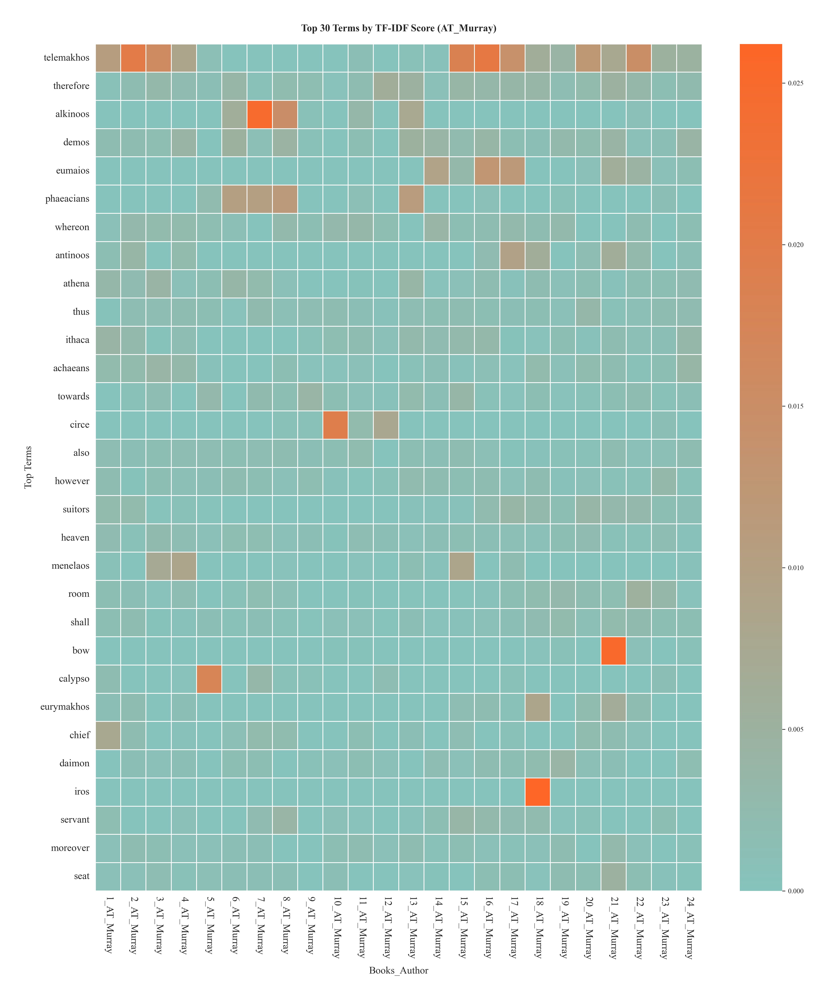

In [88]:


def create_tfidf_heatmap(df, top_n=50):
    """
    Create a heatmap of the top N terms across all books
    
    Parameters:
    -----------
    df : pandas DataFrame
        DataFrame with 'book_id' and 'tf_idf' columns
    top_n : int
        Number of top terms to include in the heatmap (default: 50)
    """
    # Extract top terms overall
    _, top_terms = extract_top_terms(df, n=top_n)
    top_terms_list = top_terms['term'].tolist()
    
    # Create a matrix of book_id x top_terms
    heatmap_data = []
    book_ids = []
    
    for _, row in df.iterrows():
        book_id = row['book_id']
        book_ids.append(book_id)
        
        tf_idf_dict = row['tf_idf']
        
        # Extract scores for top terms
        scores = [tf_idf_dict.get(term, 0) for term in top_terms_list]
        heatmap_data.append(scores)
    
    # Convert to numpy array
    heatmap_array = np.array(heatmap_data).T
    
    #keywords = list(freq_df.index)  # Get keywords from the dataframe index
    # Your custom color palette
    neptune = '#86C3BC'
    astroblue = '#FD6626' #'#003D59'
    custom_colors = ['#003D59', '#FD6626', '#177070', '#FB871D', '#641B5E', '#86C3BC', '#F5E1FD', '#414A4F', 'k']

    # Create custom colormap
    custom_cmap = LinearSegmentedColormap.from_list('neptune_blue', [neptune, astroblue])

    # Create figure
    plt.figure(figsize=(14, 8))

    # Create heatmap
    plt.figure(figsize=(14, 16))
    sns.heatmap(heatmap_array, cmap=custom_cmap, 
                xticklabels=book_ids, yticklabels=top_terms_list,
                cbar=True,
                linewidths=0.5,
                linecolor='white')
    plt.title(f'Top {top_n} Terms by TF-IDF Score ({df["book_id"].iloc[0][2:]})')
    plt.xlabel('Books_Author')
    plt.ylabel('Top Terms', fontsize=12, rotation=90)
    plt.xticks(rotation=270,fontsize=12,)
    plt.yticks(fontsize=12, rotation=0)
    plt.tight_layout()
    plt.savefig(f"{output_path_plots}/Six_XX-TFIDF_heatmap({df['book_id'].iloc[0][2:]}–{top_n}words).png")
    plt.show()
    
    return heatmap_array


heatmap_array = create_tfidf_heatmap(df_tfidf[df_tfidf['translator'] == 'AT_Murray'], top_n=30)

<Figure size 4200x2400 with 0 Axes>

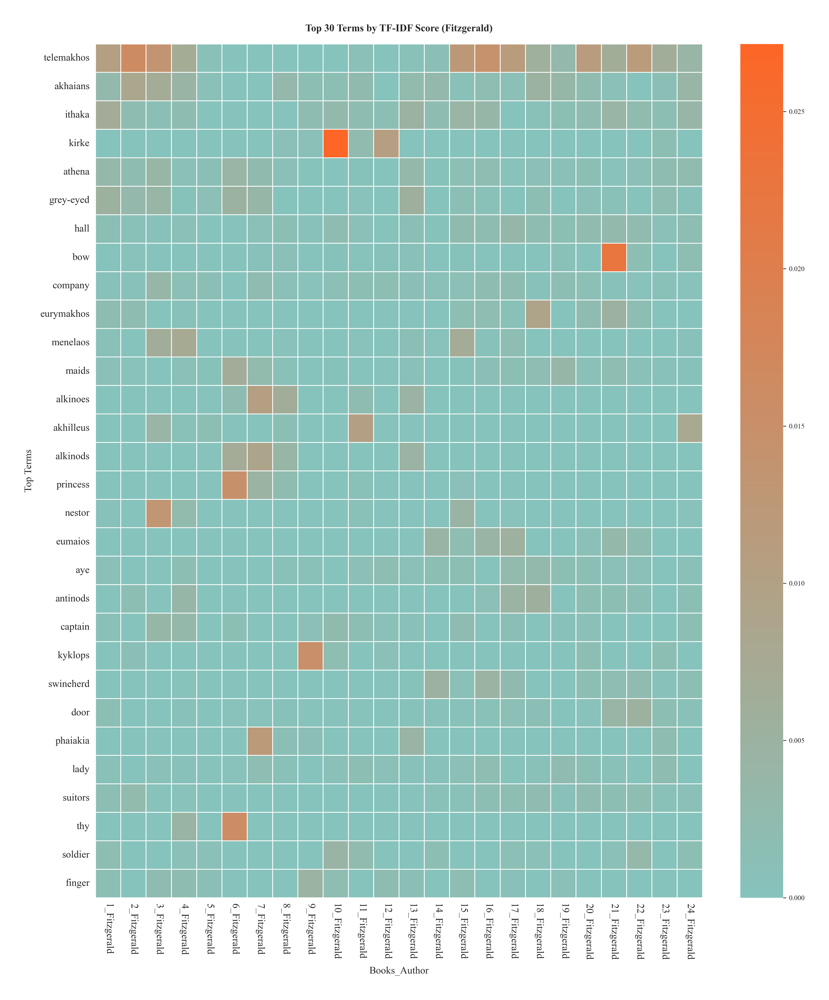

In [89]:
heatmap_array = create_tfidf_heatmap(df_tfidf[df_tfidf['translator'] == 'Fitzgerald'], top_n=30)

<Figure size 4200x2400 with 0 Axes>

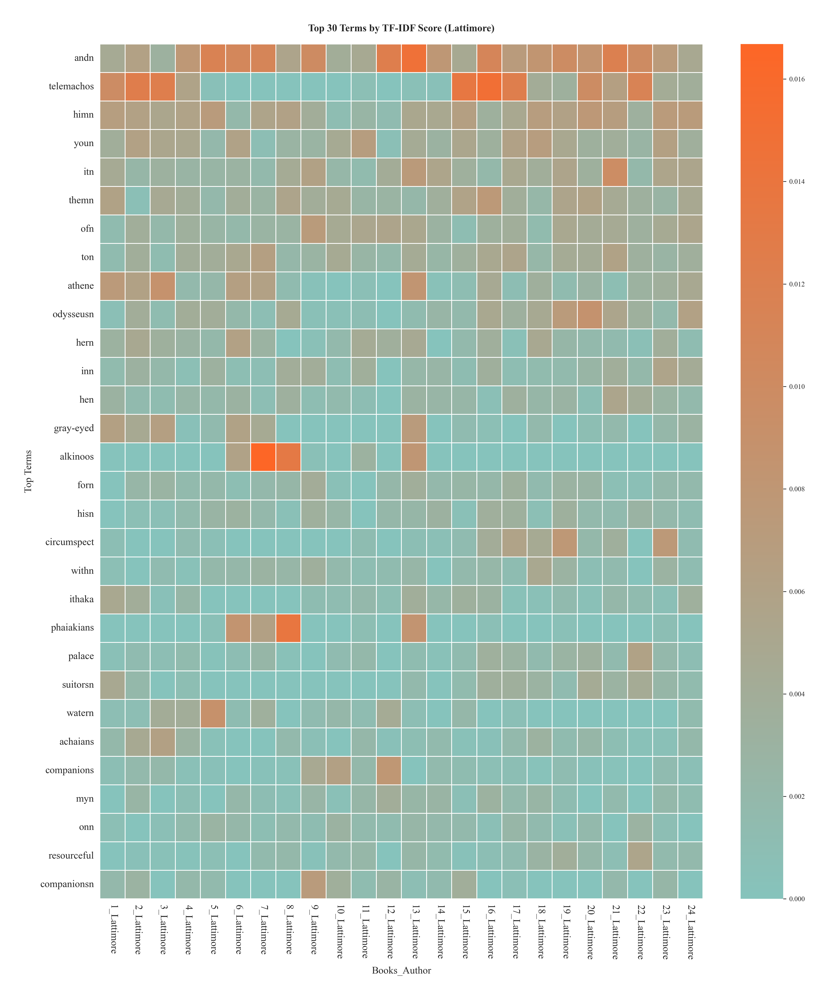

In [90]:
heatmap_array = create_tfidf_heatmap(df_tfidf[df_tfidf['translator'] == 'Lattimore'], top_n=30)

<Figure size 4200x2400 with 0 Axes>

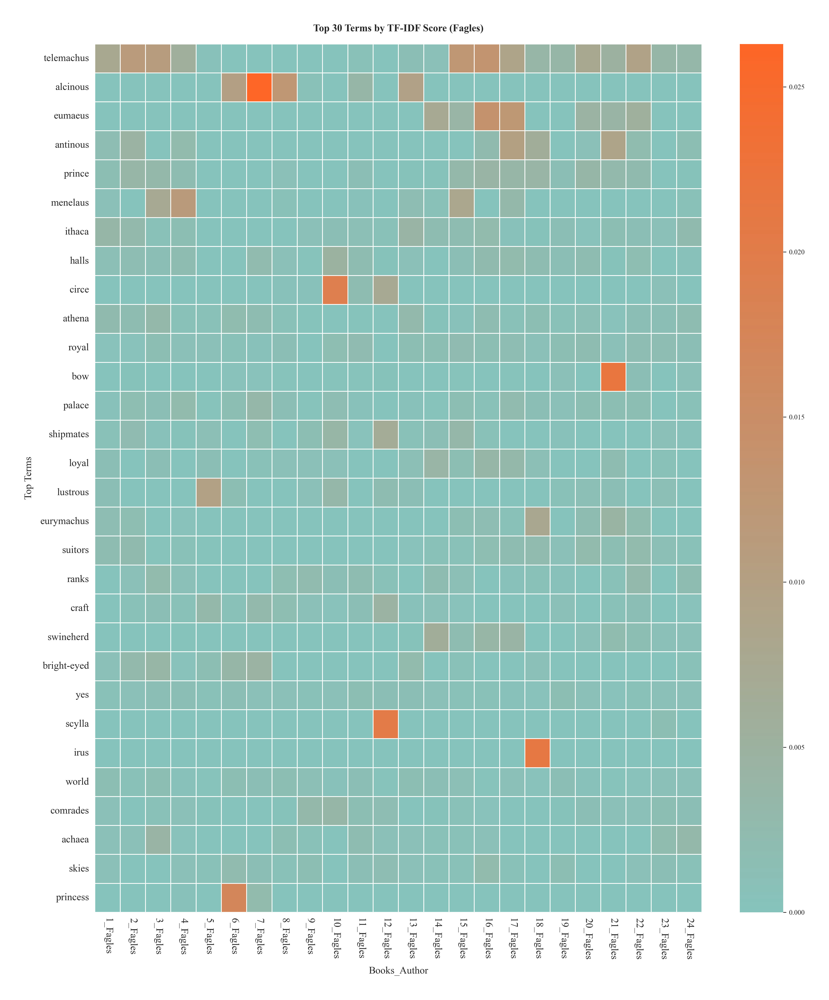

In [91]:
heatmap_array = create_tfidf_heatmap(df_tfidf[df_tfidf['translator'] == 'Fagles'], top_n=30)

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/utils.py:80: UserWarning: Glyph 64256 (\N{LATIN SMALL LIGATURE FF}) missing from current font.
  fig.canvas.draw()
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/832496728.py:57: UserWarning: Glyph 64256 (\N{LATIN SMALL LIGATURE FF}) missing from current font.
  plt.tight_layout()
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_6930/832496728.py:58: UserWarning: Glyph 64256 (\N{LATIN SMALL LIGATURE FF}) missing from current font.
  plt.savefig(f"{output_path_plots}/Six_XX-TFIDF_heatmap({df['book_id'].iloc[0][2:]}–{top_n}words).png")


<Figure size 4200x2400 with 0 Axes>

/Users/debr/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 64256 (\N{LATIN SMALL LIGATURE FF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


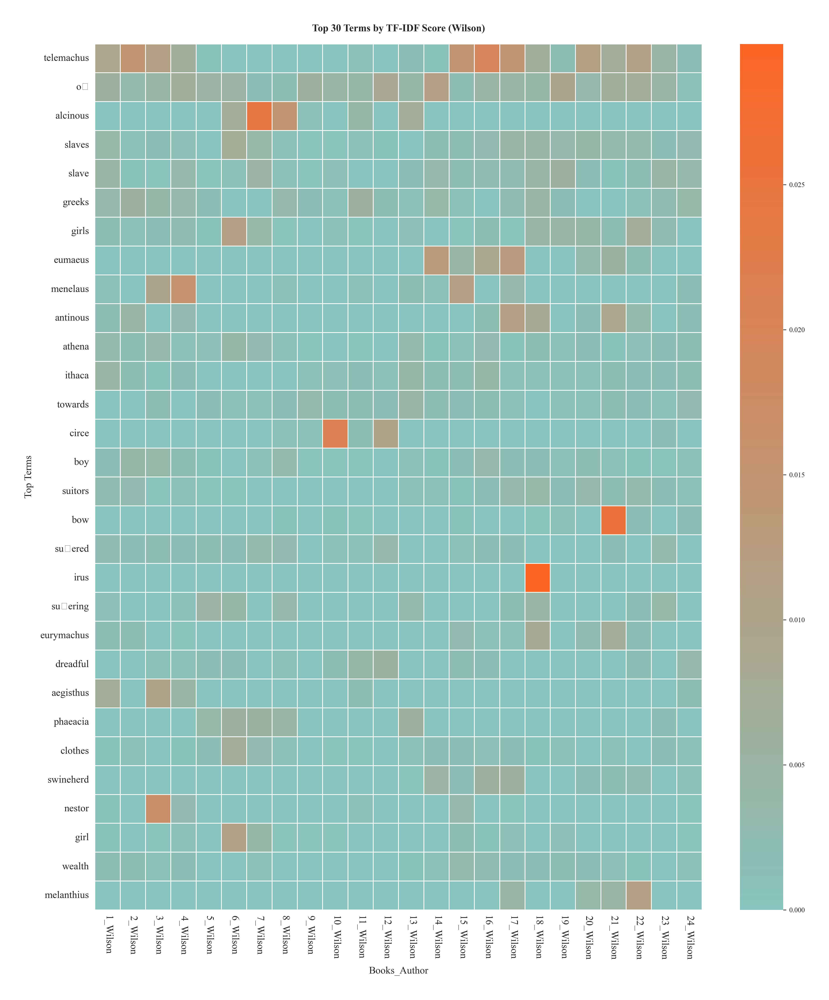

In [92]:
heatmap_array = create_tfidf_heatmap(df_tfidf[df_tfidf['translator'] == 'Wilson'], top_n=30)

<Figure size 4200x2400 with 0 Axes>

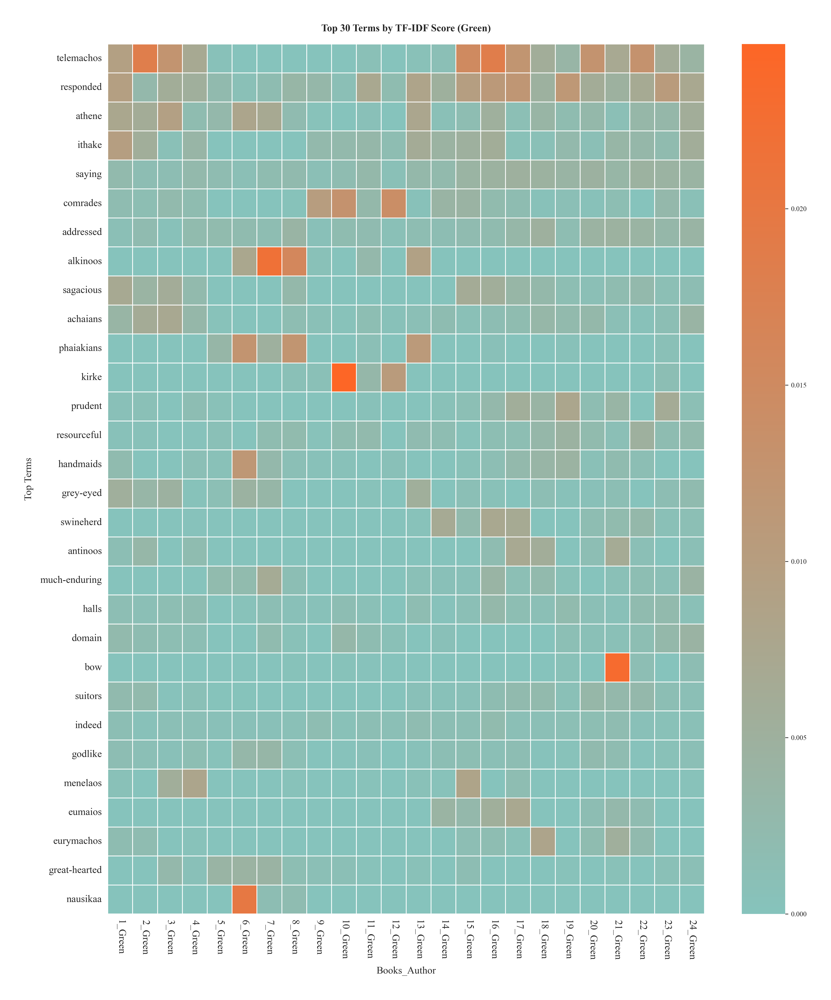

In [93]:
heatmap_array = create_tfidf_heatmap(df_tfidf[df_tfidf['translator'] == 'Green'], top_n=30)

In [78]:
df_tfidf

,translator,year,book_num,tokens,num_words,num_tokens,book_id,term_freq,term_counts,idf,tf_idf
0,AT_Murray,1919,1,"['tell', 'muse', 'manysided', 'hero', 'travele...",4187,1800,1_AT_Murray,"{'tell': 0.009444444444444445, 'muse': 0.00055...","{'tell': 17, 'muse': 1, 'manysided': 1, 'hero'...","{'tell': 0.0, 'muse': 2.1972245773362196, 'man...","{'tell': 0.0, 'muse': 0.0012206803207423442, '..."
1,AT_Murray,1919,2,"['child', 'morning', 'rosyfingered', 'dawn', '...",4245,1816,2_AT_Murray,"{'child': 0.0011013215859030838, 'morning': 0....","{'child': 2, 'morning': 1, 'rosyfingered': 1, ...","{'child': 0.2602830982636665, 'morning': 0.707...","{'child': 0.0002866553945635094, 'morning': 0...."
2,AT_Murray,1919,3,"['sun', 'rising', 'fair', 'sea', 'firmament', ...",4744,2146,3_AT_Murray,"{'sun': 0.001863932898415657, 'rising': 0.0004...","{'sun': 4, 'rising': 1, 'fair': 4, 'sea': 11, ...","{'sun': 0.14953173397096384, 'rising': 1.11966...","{'sun': 0.0002787171183056176, 'rising': 0.000..."
3,AT_Murray,1919,4,"['reached', 'low', 'lying', 'city', 'lacedaemo...",8132,3532,4_AT_Murray,"{'reached': 0.0016987542468856172, 'low': 0.00...","{'reached': 6, 'low': 1, 'lying': 2, 'city': 7...","{'reached': 0.22488117121275064, 'low': 0.9808...","{'reached': 0.00038201784464227177, 'low': 0.0..."
4,AT_Murray,1919,5,"['dawn', 'rose', 'couch', 'beside', 'tithonos'...",4715,2067,5_AT_Murray,"{'dawn': 0.001451378809869376, 'rose': 0.00096...","{'dawn': 3, 'rose': 2, 'couch': 1, 'beside': 2...","{'dawn': 0.11778303565638346, 'rose': 0.613104...","{'dawn': 0.0001709478021137641, 'rose': 0.0005..."
...,...,...,...,...,...,...,...,...,...,...,...
139,Green,2018,20,"['noble', 'odysseus', 'bedded', 'sleep', 'fore...",4129,1930,20_Green,"{'noble': 0.002072538860103627, 'odysseus': 0....","{'noble': 4, 'odysseus': 34, 'bedded': 1, 'sle...","{'noble': 0.278465417346857, 'odysseus': -0.00...","{'noble': 0.0005771303986463357, 'odysseus': -..."
140,Green,2018,21,"['goddess', 'grey-eyed', 'athene', 'put', 'min...",4650,2154,21_Green,"{'goddess': 0.00046425255338904364, 'grey-eyed...","{'goddess': 1, 'grey-eyed': 2, 'athene': 2, 'p...","{'goddess': 0.2602830982636665, 'grey-eyed': 1...","{'goddess': 0.00012083709297291853, 'grey-eyed..."
141,Green,2018,22,"['resourceful', 'odysseus', 'stripped', 'rags'...",5260,2429,22_Green,"{'resourceful': 0.004528612597776863, 'odysseu...","{'resourceful': 11, 'odysseus': 56, 'stripped'...","{'resourceful': 1.0986122886681098, 'odysseus'...","{'resourceful': 0.004975189450534874, 'odysseu..."
142,Green,2018,23,"['chuckling', 'old', 'woman', 'ascended', 'upp...",3955,1813,23_Green,"{'chuckling': 0.0005515719801434088, 'old': 0....","{'chuckling': 1, 'old': 8, 'woman': 7, 'ascend...","{'chuckling': 3.58351893845611, 'old': 0.15762...","{'chuckling': 0.0019765686367656425, 'old': 0...."


Wilson shows similar results to Green, using the step by step approach. Wilson's Odyssey (df) will be processed by the **e2e function**, so both translations have the same processing. 

In [ ]:
# Getting and then comparing W & G's 30 top terms 
tt_W = top_terms_overall_W['term'][:30]
tt_G = top_terms_overall_G['term'][:30]

# New df with the top terms from both for comparison
top_terms_overall = pd.DataFrame({'Wilson': tt_W, 'Green': tt_G})
top_terms_overall.T

- 📊 **Parametric Hypothesis Testing:** Assessing significant variations. 

Checking at the word by word comparison in the df above the similarities in choice of words is apparent. However, when testing systematically the set of terms, the data tells a different story.   
Before chosing the test we need to check if the data distribution is normal. For this I wll plot their frequencies in a histogram and the scattered quantiles in a Q-Q plot. Then, the Sahpiro test for normality.

In [ ]:
# Calculate the sum of the tf-idf scores for each translation
itidf_W = df_tfidf_W["tf_idf"].apply(lambda x: list(x.values())).sum()
itidf_G = df_tfidf_G["tf_idf"].apply(lambda x: list(x.values())).sum()

In [ ]:
import scipy.stats as stats
# Q-Q plot for ITIDF values
def plot_qq(itidf, translator="Wilson"):
    """
    Create a Q-Q plot for the ITIDF values.
    
    Parameters:
    -----------
    itidf : list
        List of ITIDF values to plot
    """
    # Generate a Q-Q plot
    stats.probplot(itidf_W, dist="norm", plot=plt)
    plt.title(f"Q-Q Plot for ITIDF Values ({translator})")
    #plt.savefig(f"/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/Q-Q_Plot_{translator}.png")
    plt.show()

def plot_itidf_distribution(itidf, translator="Wilson"):
    """
    Plot the distribution of ITIDF values.
    
    Parameters:
    -----------
    itidf : list
        List of ITIDF values to plot
    """
    # Create a histogram of the ITIDF values
    sns.histplot(itidf, bins=30, kde=True)  # KDE adds a smoothed curve
    plt.title(f"ITIDF Distribution ({translator})")
    #plt.savefig(f"/Users/debr/English-Homer/MVP_Green-Wilson/MVP_plots/ITIDF_Distribution_{translator}.png")
    plt.show()

# Plot Q-Q plot and distribution for ITIDF values for Wilson
plot_qq(itidf_W, "Wilson")
plot_itidf_distribution(itidf_W, "Wilson")

In [ ]:
# Plot Q-Q plot and distribution for ITIDF values for Green
plot_qq(itidf_G, "Green")
plot_itidf_distribution(itidf_G, "Green")

In [ ]:
from scipy.stats import shapiro
# Shapiro test for normality
def shapiro_test(data):
    """"
    Perform the Shapiro-Wilk test for normality from scipy.stats and print the results.

    Parameters:
    -----------
    data : list or array
        The data to be tested for normality.

    Returns: shapiro statistic and p-value

    """        
    stat, p = shapiro(data)
    print(f"Shapiro-Wilk Test: p-value = {p}")

    if p > 0.05:
        print("Data appears to be normally distributed (fail to reject H0).")
    else:
        print("Data is not normally distributed (reject H0).")
    return stat, p

# Shapiro-Wilk test for normality
print("Wilson")
shapiro_test(itidf_W)
print("\n")
print("Green")
shapiro_test(itidf_G)

Time to test.

#### **Hypotheses:**
* Null Hypothesis (H₀): There is no significant difference in the TF-IDF values between the two translations (Wilson and Green).
* Alternative Hypothesis (H₁): There is a significant difference in the TF-IDF values between the two translations.

The Mann-Whitney U test evaluates whether the distributions of TF-IDF values for the two translations differ, considering their ranks rather than specific values.

**Why the Mann-Whitney U Test**

Since the data for the TF-IDF values is not normally distributed, a parametric test like the t-test is not appropriate. Instead, the Mann-Whitney U test is used, which is a non-parametric test for comparing two independent samples. It does not require the assumption of normality and is suitable for comparing distributions when the data is skewed or has outliers.

In [ ]:
# Mannwhitney U test for comparing ITIDF values
from scipy.stats import mannwhitneyu  # Import the actual function

def mannwhitneyu_test(x, y, alternative='two-sided'):
    """
    Perform the Mann-Whitney U test for comparing two independent samples.
    """
    stat, p = mannwhitneyu(x, y, alternative=alternative)  # Use SciPy's function
    print(f"Mann-Whitney U test statistic: {stat}, p-value: {p}")

    if p < 0.05:
        print("Reject H₀: The distributions of the translations are significantly different.")
    else:
        print("Fail to reject H₀: No significant difference between the translations.")

# Run the test
mannwhitneyu_test(itidf_W, itidf_G, alternative='two-sided')

# Discussion of Results

After conducting three experiments with accompanying statistical tests, our analysis provides valuable insights into the lexical characteristics of Green and Wilson's translations of *The Odyssey*. While our sample size represents an MVP analysis and cannot support definitive conclusions, the methodology demonstrates effectiveness in yielding meaningful linguistic insights.

## Type-Token Ratio (TTR) Analysis

### Statistical Findings
The t-test comparing TTR values between Wilson's and Green's translations revealed no statistically significant difference (p ≥ 0.05), supporting the null hypothesis that their lexical diversity is quantitatively similar. Rather than being inconclusive, this finding offers critical insight into translation dynamics.

### Linguistic Interpretation
The comparable TTR values suggest that both translators, despite working independently, operate within similar lexical parameters. This statistical similarity indicates that both translations maintain equivalent levels of vocabulary richness and complexity. The absence of significant difference points to:

- **Shared Cultural Framework**: Both translators draw from the same linguistic resources and cultural contexts, influencing their word choice patterns.
- **Similar Translation Approaches**: Despite potential stylistic differences, both translators appear to balance faithfulness to the source text with considerations of modern readability.
- **Common Professional Standards**: The comparable lexical diversity suggests adherence to similar academic and literary translation norms.

## Zipf's Law Analysis

### Statistical Findings
The nearly identical 95% confidence intervals for Wilson's and Green's Zipfian slopes demonstrate that both translations follow remarkably similar word frequency distributions. This statistical congruence further validates the patterns observed in the TTR analysis.

### Linguistic Interpretation
The Zipfian distribution results indicate that both translations maintain natural statistical language structures. Despite individual stylistic choices, both translators:

- **Preserve Natural Language Patterns**: Both translations adhere to the expected power law distribution of word frequencies that characterizes natural language.
- **Balance Common and Rare Words**: The similar slopes suggest comparable approaches to balancing frequently used words with more specialized vocabulary.
- **Reflect Similar Lexical Economy**: Both translations demonstrate equivalent efficiency in word usage patterns, suggesting similar approaches to conveying meaning within the constraints of English.

## TF-IDF Analysis

### Statistical Findings
The Mann-Whitney U test (test statistic: 398451440.5, p-value: 2.32e-146) revealed a highly significant difference between the TF-IDF distributions of the two translations. This extremely small p-value strongly rejects the null hypothesis of similar distributions.

### Linguistic Interpretation
Unlike the previous two measures, the TF-IDF analysis reveals significant differences in how the two translators emphasize specific words and concepts:

- **Distinct Emphasis Patterns**: While overall lexical diversity is similar, the translators differ markedly in which specific words they emphasize relative to the overall corpus.
- **Unique Interpretive Approaches**: The divergent TF-IDF values suggest different interpretations of which concepts require emphasis or elaboration.
- **Different Lexical Focusing**: Despite similar overall vocabulary richness, the two translators appear to focus on different elements of the narrative through their word choice.

## Implications for Translation Studies

These findings have several important implications for translation studies:

1. **Cultural Embeddedness of Translation**: The similarity in TTR and Zipfian distributions supports Bourdieu's concept of habitus—translators internalize shared linguistic and literary norms that influence their work, even unconsciously.

2. **Balancing Individual Style and Cultural Context**: While translators maintain individual approaches (evident in TF-IDF differences), they remain bound by shared linguistic and cultural forces (shown in TTR and Zipf similarities).

3. **Quantifiable Translation Differences**: The contrasting results between frequency-based measures (TTR, Zipf) and emphasis-based measures (TF-IDF) suggest that translation differences may be more evident in which elements translators choose to emphasize rather than in overall vocabulary richness––translator's agency.

4. **Methodological Insights**: The combination of these three statistical approaches provides a more nuanced understanding than any single measure could offer, demonstrating the value of multi-dimensional analysis in translation studies.

## Future Research Directions

To build upon this MVP analysis, future research could explore:

### **More Methods:**

   - **Lexical Choice (Etymology) Analysis**
   - **Syntactic Complexity Methods**
   - **Stylometrics and Thematic Mapping**

### **Expanded Corpus**: 

Applying these methods to a larger sample of the translations to confirm whether these patterns persist throughout the complete works. And thus…

   - **Cross-Temporal Studies**: Expanding the analysis to include translations from different time periods to determine how temporal context influences translation.

This quantitative analysis serves as an empirical foundation for qualitative exploration of how Green and Wilson have shaped *The Odyssey's* language, structure, and poetic essence, enriching our understanding of literary interpretation in classical texts.